# Imports

In [1]:
import torch
from torch.utils.data import DataLoader
from torchvision import transforms
from torchvision.datasets import ImageFolder
from torch import nn
from helpers import *
from models import *

# Preprocessing

In [2]:
dataset_dir = "./Teeth DataSet/Teeth_Dataset"

show_counts function is in file helpers/utils.py

In [3]:
train_class_weights, train_class_weights_norm, train_class_counts = show_counts(f"{dataset_dir}/Training")

Class 'CaS' contains 480 images.
Class 'CoS' contains 450 images.
Class 'Gum' contains 360 images.
Class 'MC' contains 540 images.
Class 'OC' contains 324 images.
Class 'OLP' contains 540 images.
Class 'OT' contains 393 images.


In [4]:
train_class_weights_norm

{'CaS': 0.12689335505026225,
 'CoS': 0.13535291205361308,
 'Gum': 0.16919114006701633,
 'MC': 0.11279409337801088,
 'OC': 0.18799015563001817,
 'OLP': 0.11279409337801088,
 'OT': 0.15498425044306838}

In [5]:
im_target_shape = (224, 224)
train_transform = transforms.Compose([
    transforms.Resize(im_target_shape),
    transforms.RandomHorizontalFlip(),  # Randomly flip the image horizontally
    transforms.RandomRotation(10),      # Randomly rotate the image by up to 10 degrees
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
test_transform = transforms.Compose([
    transforms.Resize(im_target_shape),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
train_dataset = ImageFolder(root=f'{dataset_dir}/Training', transform=train_transform)
val_dataset = ImageFolder(root=f'{dataset_dir}/Validation', transform=test_transform)
test_dataset = ImageFolder(root=f'{dataset_dir}/Testing', transform=test_transform)

batch_size = 16
train_loader = DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(dataset=val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False, num_workers=4)


In [6]:
test_dataset.classes

['CaS', 'CoS', 'Gum', 'MC', 'OC', 'OLP', 'OT']

# Model

## Resnet18

create_resnet function is in file models/resnet_finetuned.py

In [6]:
resnet18 = create_resnet(num_classes=len(train_dataset.classes), resnet_type="resnet18")

c:\Users\001\anaconda3\envs\pytorch-env\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\001\anaconda3\envs\pytorch-env\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
optimizer = torch.optim.Adam(resnet18.parameters(), lr=0.001, weight_decay=0.0001)
train_class_weights_norm_tensor = torch.tensor(list(train_class_weights_norm.values())).to(device)
criterion = nn.CrossEntropyLoss(weight=train_class_weights_norm_tensor)
num_epochs = 10

train function is in file helpers/train.py

In [9]:
train(
    model=resnet18,
    optimizer=optimizer, 
    criterion=criterion, 
    train_loader=train_loader, 
    val_loader=val_loader, 
    num_epochs=num_epochs, 
    device=device,
    models_weights_path="./models_weights/resnet18/best_model.pth")


Epoch 1/10
----------


100%|██████████| 193/193 [00:12<00:00, 15.99it/s]


Train Loss: 1.5031, Accuracy: 43.12%, Precision: 0.4284, Recall: 0.4312, F1 Score: 0.4276


100%|██████████| 65/65 [00:08<00:00,  7.64it/s]


Val Loss: 1.7109, Accuracy: 47.86%, Precision: 0.5907, Recall: 0.4786, F1 Score: 0.4613
--------------------------------------------------
Best model saved with Val Loss: 1.7109
Epoch 2/10
----------


100%|██████████| 193/193 [00:11<00:00, 17.15it/s]


Train Loss: 1.0791, Accuracy: 60.61%, Precision: 0.6042, Recall: 0.6061, F1 Score: 0.6030


100%|██████████| 65/65 [00:07<00:00,  8.95it/s]


Val Loss: 1.0595, Accuracy: 62.65%, Precision: 0.6906, Recall: 0.6265, F1 Score: 0.6083
--------------------------------------------------
Best model saved with Val Loss: 1.0595
Epoch 3/10
----------


100%|██████████| 193/193 [00:11<00:00, 17.41it/s]


Train Loss: 0.9113, Accuracy: 66.80%, Precision: 0.6674, Recall: 0.6680, F1 Score: 0.6664


100%|██████████| 65/65 [00:07<00:00,  9.20it/s]


Val Loss: 0.9874, Accuracy: 64.20%, Precision: 0.7186, Recall: 0.6420, F1 Score: 0.6259
--------------------------------------------------
Best model saved with Val Loss: 0.9874
Epoch 4/10
----------


100%|██████████| 193/193 [00:10<00:00, 17.69it/s]


Train Loss: 0.7462, Accuracy: 73.44%, Precision: 0.7339, Recall: 0.7344, F1 Score: 0.7329


100%|██████████| 65/65 [00:08<00:00,  7.36it/s]


Val Loss: 0.6670, Accuracy: 72.67%, Precision: 0.7605, Recall: 0.7267, F1 Score: 0.7184
--------------------------------------------------
Best model saved with Val Loss: 0.6670
Epoch 5/10
----------


100%|██████████| 193/193 [00:10<00:00, 17.77it/s]


Train Loss: 0.6678, Accuracy: 76.35%, Precision: 0.7626, Recall: 0.7635, F1 Score: 0.7617


100%|██████████| 65/65 [00:07<00:00,  9.21it/s]


Val Loss: 0.4775, Accuracy: 82.20%, Precision: 0.8409, Recall: 0.8220, F1 Score: 0.8210
--------------------------------------------------
Best model saved with Val Loss: 0.4775
Epoch 6/10
----------


100%|██████████| 193/193 [00:10<00:00, 17.99it/s]


Train Loss: 0.5097, Accuracy: 81.79%, Precision: 0.8176, Recall: 0.8179, F1 Score: 0.8172


100%|██████████| 65/65 [00:07<00:00,  9.03it/s]


Val Loss: 0.5341, Accuracy: 81.61%, Precision: 0.8252, Recall: 0.8161, F1 Score: 0.8165
--------------------------------------------------
Epoch 7/10
----------


100%|██████████| 193/193 [00:10<00:00, 17.97it/s]


Train Loss: 0.4048, Accuracy: 85.94%, Precision: 0.8593, Recall: 0.8594, F1 Score: 0.8590


100%|██████████| 65/65 [00:07<00:00,  8.94it/s]


Val Loss: 0.4284, Accuracy: 84.44%, Precision: 0.8594, Recall: 0.8444, F1 Score: 0.8409
--------------------------------------------------
Best model saved with Val Loss: 0.4284
Epoch 8/10
----------


100%|██████████| 193/193 [00:10<00:00, 18.09it/s]


Train Loss: 0.4029, Accuracy: 85.81%, Precision: 0.8581, Recall: 0.8581, F1 Score: 0.8578


100%|██████████| 65/65 [00:07<00:00,  9.24it/s]


Val Loss: 0.3067, Accuracy: 89.88%, Precision: 0.9032, Recall: 0.8988, F1 Score: 0.8981
--------------------------------------------------
Best model saved with Val Loss: 0.3067
Epoch 9/10
----------


100%|██████████| 193/193 [00:10<00:00, 18.00it/s]


Train Loss: 0.3440, Accuracy: 87.66%, Precision: 0.8772, Recall: 0.8766, F1 Score: 0.8764


100%|██████████| 65/65 [00:07<00:00,  9.26it/s]


Val Loss: 0.2936, Accuracy: 89.88%, Precision: 0.9019, Recall: 0.8988, F1 Score: 0.8988
--------------------------------------------------
Best model saved with Val Loss: 0.2936
Epoch 10/10
----------


100%|██████████| 193/193 [00:10<00:00, 18.03it/s]


Train Loss: 0.3063, Accuracy: 89.37%, Precision: 0.8937, Recall: 0.8937, F1 Score: 0.8935


100%|██████████| 65/65 [00:07<00:00,  9.23it/s]

Val Loss: 0.3377, Accuracy: 87.06%, Precision: 0.8865, Recall: 0.8706, F1 Score: 0.8701
--------------------------------------------------


evaluate function is in file helpers/evaluate.py

In [11]:
evaluate(dataloader=test_loader, model=resnet18, device=device, criterion=criterion)

100%|██████████| 65/65 [00:07<00:00,  8.97it/s]


(0.35067928700636214,
 87.64591439688716,
 0.891959017350064,
 0.8764591439688716,
 0.8762765484632277)

### Continue training for 10 more epochs (from 10 to 20)

In [13]:
train(
    model=resnet18,
    optimizer=optimizer, 
    criterion=criterion, 
    train_loader=train_loader, 
    val_loader=val_loader, 
    num_epochs=20,
    start_epoch=10, 
    device=device,
    models_weights_path="./models_weights/resnet18/best_model.pth")


Epoch 11/20
----------


100%|██████████| 193/193 [00:10<00:00, 18.43it/s]


Train Loss: 0.2612, Accuracy: 90.18%, Precision: 0.9020, Recall: 0.9018, F1 Score: 0.9016


100%|██████████| 65/65 [00:05<00:00, 11.66it/s]


Val Loss: 0.3334, Accuracy: 89.01%, Precision: 0.8969, Recall: 0.8901, F1 Score: 0.8893
--------------------------------------------------
Best model saved with Val Loss: 0.3334
Epoch 12/20
----------


100%|██████████| 193/193 [00:10<00:00, 17.71it/s]


Train Loss: 0.2086, Accuracy: 92.68%, Precision: 0.9270, Recall: 0.9268, F1 Score: 0.9266


100%|██████████| 65/65 [00:07<00:00,  8.49it/s]


Val Loss: 0.1580, Accuracy: 94.94%, Precision: 0.9512, Recall: 0.9494, F1 Score: 0.9494
--------------------------------------------------
Best model saved with Val Loss: 0.1580
Epoch 13/20
----------


100%|██████████| 193/193 [00:11<00:00, 17.40it/s]


Train Loss: 0.2577, Accuracy: 91.19%, Precision: 0.9119, Recall: 0.9119, F1 Score: 0.9117


100%|██████████| 65/65 [00:07<00:00,  8.24it/s]


Val Loss: 0.3605, Accuracy: 86.67%, Precision: 0.8822, Recall: 0.8667, F1 Score: 0.8660
--------------------------------------------------
Epoch 14/20
----------


100%|██████████| 193/193 [00:10<00:00, 17.57it/s]


Train Loss: 0.2045, Accuracy: 93.00%, Precision: 0.9300, Recall: 0.9300, F1 Score: 0.9299


100%|██████████| 65/65 [00:06<00:00,  9.31it/s]


Val Loss: 0.3214, Accuracy: 88.62%, Precision: 0.8899, Recall: 0.8862, F1 Score: 0.8851
--------------------------------------------------
Epoch 15/20
----------


100%|██████████| 193/193 [00:10<00:00, 17.60it/s]


Train Loss: 0.2379, Accuracy: 91.84%, Precision: 0.9183, Recall: 0.9184, F1 Score: 0.9183


100%|██████████| 65/65 [00:07<00:00,  8.98it/s]


Val Loss: 0.1880, Accuracy: 93.77%, Precision: 0.9413, Recall: 0.9377, F1 Score: 0.9377
--------------------------------------------------
Epoch 16/20
----------


100%|██████████| 193/193 [00:10<00:00, 17.61it/s]


Train Loss: 0.1915, Accuracy: 93.26%, Precision: 0.9327, Recall: 0.9326, F1 Score: 0.9326


100%|██████████| 65/65 [00:07<00:00,  8.96it/s]


Val Loss: 0.2246, Accuracy: 91.93%, Precision: 0.9215, Recall: 0.9193, F1 Score: 0.9184
--------------------------------------------------
Epoch 17/20
----------


100%|██████████| 193/193 [00:11<00:00, 17.22it/s]


Train Loss: 0.2333, Accuracy: 92.03%, Precision: 0.9204, Recall: 0.9203, F1 Score: 0.9202


100%|██████████| 65/65 [00:07<00:00,  9.11it/s]


Val Loss: 0.4461, Accuracy: 86.19%, Precision: 0.8776, Recall: 0.8619, F1 Score: 0.8573
--------------------------------------------------
Epoch 18/20
----------


100%|██████████| 193/193 [00:10<00:00, 17.89it/s]


Train Loss: 0.1666, Accuracy: 94.40%, Precision: 0.9440, Recall: 0.9440, F1 Score: 0.9439


100%|██████████| 65/65 [00:07<00:00,  8.36it/s]


Val Loss: 0.1163, Accuracy: 96.01%, Precision: 0.9615, Recall: 0.9601, F1 Score: 0.9602
--------------------------------------------------
Best model saved with Val Loss: 0.1163
Epoch 19/20
----------


100%|██████████| 193/193 [00:11<00:00, 16.87it/s]


Train Loss: 0.1853, Accuracy: 94.14%, Precision: 0.9414, Recall: 0.9414, F1 Score: 0.9413


100%|██████████| 65/65 [00:07<00:00,  8.25it/s]


Val Loss: 0.1666, Accuracy: 94.16%, Precision: 0.9433, Recall: 0.9416, F1 Score: 0.9418
--------------------------------------------------
Epoch 20/20
----------


100%|██████████| 193/193 [00:11<00:00, 17.52it/s]


Train Loss: 0.1507, Accuracy: 94.59%, Precision: 0.9461, Recall: 0.9459, F1 Score: 0.9458


100%|██████████| 65/65 [00:07<00:00,  8.15it/s]

Val Loss: 0.1400, Accuracy: 95.04%, Precision: 0.9533, Recall: 0.9504, F1 Score: 0.9506
--------------------------------------------------


after 20 epochs

In [18]:
torch.save(resnet18, "./models_weights/resnet18/final_model.pth")

## Resnet50

In [7]:
resnet50 = create_resnet(num_classes=len(train_dataset.classes), resnet_type="resnet50")

c:\Users\001\anaconda3\envs\pytorch-env\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\001\anaconda3\envs\pytorch-env\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [8]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
optimizer = torch.optim.Adam(resnet50.parameters(), lr=0.001, weight_decay=0.0001)
train_class_weights_norm_tensor = torch.tensor(list(train_class_weights_norm.values())).to(device)
criterion = nn.CrossEntropyLoss(weight=train_class_weights_norm_tensor)
num_epochs = 20

In [9]:
history = train(
    model=resnet50,
    optimizer=optimizer, 
    criterion=criterion, 
    train_loader=train_loader, 
    val_loader=val_loader, 
    num_epochs=num_epochs, 
    device=device,
    models_weights_path="./models_weights/resnet50/best_model.pth")


Epoch 1/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.10it/s]


Train Loss: 1.9026, Accuracy: 23.13%, Precision: 0.2338, Recall: 0.2313, F1 Score: 0.2290


100%|██████████| 65/65 [00:08<00:00,  7.45it/s]
c:\Users\001\anaconda3\envs\pytorch-env\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Val Loss: 2.0205, Accuracy: 27.72%, Precision: 0.2477, Recall: 0.2772, F1 Score: 0.2298
--------------------------------------------------
Best model saved with Val Loss: 2.0205
Epoch 2/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.26it/s]


Train Loss: 1.6871, Accuracy: 31.91%, Precision: 0.3073, Recall: 0.3191, F1 Score: 0.3041


100%|██████████| 65/65 [00:07<00:00,  8.20it/s]


Val Loss: 1.6446, Accuracy: 30.06%, Precision: 0.3737, Recall: 0.3006, F1 Score: 0.2564
--------------------------------------------------
Best model saved with Val Loss: 1.6446
Epoch 3/20
----------


100%|██████████| 193/193 [00:17<00:00, 10.82it/s]


Train Loss: 1.5747, Accuracy: 37.19%, Precision: 0.3617, Recall: 0.3719, F1 Score: 0.3592


100%|██████████| 65/65 [00:07<00:00,  8.46it/s]


Val Loss: 1.4015, Accuracy: 46.21%, Precision: 0.4799, Recall: 0.4621, F1 Score: 0.4484
--------------------------------------------------
Best model saved with Val Loss: 1.4015
Epoch 4/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.22it/s]


Train Loss: 1.4281, Accuracy: 43.44%, Precision: 0.4269, Recall: 0.4344, F1 Score: 0.4268


100%|██████████| 65/65 [00:08<00:00,  7.88it/s]


Val Loss: 1.3052, Accuracy: 47.57%, Precision: 0.5093, Recall: 0.4757, F1 Score: 0.4665
--------------------------------------------------
Best model saved with Val Loss: 1.3052
Epoch 5/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.12it/s]


Train Loss: 1.3451, Accuracy: 47.46%, Precision: 0.4703, Recall: 0.4746, F1 Score: 0.4680


100%|██████████| 65/65 [00:08<00:00,  7.55it/s]


Val Loss: 1.3671, Accuracy: 45.62%, Precision: 0.5183, Recall: 0.4562, F1 Score: 0.4435
--------------------------------------------------
Epoch 6/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.07it/s]


Train Loss: 1.3043, Accuracy: 48.30%, Precision: 0.4782, Recall: 0.4830, F1 Score: 0.4777


100%|██████████| 65/65 [00:08<00:00,  7.79it/s]


Val Loss: 1.1758, Accuracy: 53.79%, Precision: 0.5446, Recall: 0.5379, F1 Score: 0.5328
--------------------------------------------------
Best model saved with Val Loss: 1.1758
Epoch 7/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.12it/s]


Train Loss: 1.2461, Accuracy: 51.25%, Precision: 0.5095, Recall: 0.5125, F1 Score: 0.5064


100%|██████████| 65/65 [00:08<00:00,  7.70it/s]


Val Loss: 1.2230, Accuracy: 53.02%, Precision: 0.5574, Recall: 0.5302, F1 Score: 0.5115
--------------------------------------------------
Epoch 8/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.16it/s]


Train Loss: 1.2005, Accuracy: 53.13%, Precision: 0.5299, Recall: 0.5313, F1 Score: 0.5277


100%|██████████| 65/65 [00:08<00:00,  7.81it/s]


Val Loss: 1.1508, Accuracy: 55.35%, Precision: 0.5846, Recall: 0.5535, F1 Score: 0.5323
--------------------------------------------------
Best model saved with Val Loss: 1.1508
Epoch 9/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.28it/s]


Train Loss: 1.1469, Accuracy: 55.36%, Precision: 0.5519, Recall: 0.5536, F1 Score: 0.5496


100%|██████████| 65/65 [00:08<00:00,  7.94it/s]


Val Loss: 1.0549, Accuracy: 58.46%, Precision: 0.6311, Recall: 0.5846, F1 Score: 0.5912
--------------------------------------------------
Best model saved with Val Loss: 1.0549
Epoch 10/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.01it/s]


Train Loss: 1.0916, Accuracy: 57.24%, Precision: 0.5714, Recall: 0.5724, F1 Score: 0.5690


100%|██████████| 65/65 [00:08<00:00,  7.91it/s]


Val Loss: 1.0229, Accuracy: 60.80%, Precision: 0.6214, Recall: 0.6080, F1 Score: 0.5957
--------------------------------------------------
Best model saved with Val Loss: 1.0229
Epoch 11/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.10it/s]


Train Loss: 1.0642, Accuracy: 59.44%, Precision: 0.5907, Recall: 0.5944, F1 Score: 0.5902


100%|██████████| 65/65 [00:08<00:00,  7.70it/s]


Val Loss: 0.9778, Accuracy: 62.74%, Precision: 0.6629, Recall: 0.6274, F1 Score: 0.6236
--------------------------------------------------
Best model saved with Val Loss: 0.9778
Epoch 12/20
----------


100%|██████████| 193/193 [00:16<00:00, 11.55it/s]


Train Loss: 0.9959, Accuracy: 62.07%, Precision: 0.6192, Recall: 0.6207, F1 Score: 0.6175


100%|██████████| 65/65 [00:07<00:00,  8.36it/s]


Val Loss: 0.9624, Accuracy: 64.01%, Precision: 0.6817, Recall: 0.6401, F1 Score: 0.6307
--------------------------------------------------
Best model saved with Val Loss: 0.9624
Epoch 13/20
----------


100%|██████████| 193/193 [00:16<00:00, 11.57it/s]


Train Loss: 0.9890, Accuracy: 63.30%, Precision: 0.6316, Recall: 0.6330, F1 Score: 0.6299


100%|██████████| 65/65 [00:07<00:00,  8.13it/s]


Val Loss: 0.8657, Accuracy: 65.86%, Precision: 0.6926, Recall: 0.6586, F1 Score: 0.6589
--------------------------------------------------
Best model saved with Val Loss: 0.8657
Epoch 14/20
----------


100%|██████████| 193/193 [00:16<00:00, 11.51it/s]


Train Loss: 0.9137, Accuracy: 65.99%, Precision: 0.6582, Recall: 0.6599, F1 Score: 0.6574


100%|██████████| 65/65 [00:07<00:00,  8.42it/s]


Val Loss: 0.8821, Accuracy: 66.05%, Precision: 0.7021, Recall: 0.6605, F1 Score: 0.6578
--------------------------------------------------
Epoch 15/20
----------


100%|██████████| 193/193 [00:16<00:00, 11.36it/s]


Train Loss: 0.8790, Accuracy: 67.61%, Precision: 0.6738, Recall: 0.6761, F1 Score: 0.6730


100%|██████████| 65/65 [00:08<00:00,  8.10it/s]


Val Loss: 0.7797, Accuracy: 70.33%, Precision: 0.7482, Recall: 0.7033, F1 Score: 0.6911
--------------------------------------------------
Best model saved with Val Loss: 0.7797
Epoch 16/20
----------


100%|██████████| 193/193 [00:17<00:00, 10.99it/s]


Train Loss: 0.8484, Accuracy: 68.19%, Precision: 0.6798, Recall: 0.6819, F1 Score: 0.6790


100%|██████████| 65/65 [00:07<00:00,  8.18it/s]


Val Loss: 0.7922, Accuracy: 70.82%, Precision: 0.7522, Recall: 0.7082, F1 Score: 0.7007
--------------------------------------------------
Epoch 17/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.29it/s]


Train Loss: 0.7766, Accuracy: 70.75%, Precision: 0.7064, Recall: 0.7075, F1 Score: 0.7054


100%|██████████| 65/65 [00:07<00:00,  8.27it/s]


Val Loss: 0.7494, Accuracy: 71.98%, Precision: 0.7413, Recall: 0.7198, F1 Score: 0.7224
--------------------------------------------------
Best model saved with Val Loss: 0.7494
Epoch 18/20
----------


100%|██████████| 193/193 [00:17<00:00, 11.14it/s]


Train Loss: 0.7704, Accuracy: 71.14%, Precision: 0.7108, Recall: 0.7114, F1 Score: 0.7095


100%|██████████| 65/65 [00:07<00:00,  8.22it/s]


Val Loss: 0.5797, Accuracy: 78.99%, Precision: 0.7947, Recall: 0.7899, F1 Score: 0.7889
--------------------------------------------------
Best model saved with Val Loss: 0.5797
Epoch 19/20
----------


100%|██████████| 193/193 [00:17<00:00, 10.97it/s]


Train Loss: 0.7007, Accuracy: 74.38%, Precision: 0.7429, Recall: 0.7438, F1 Score: 0.7426


100%|██████████| 65/65 [00:08<00:00,  7.79it/s]


Val Loss: 0.8558, Accuracy: 68.77%, Precision: 0.7297, Recall: 0.6877, F1 Score: 0.6816
--------------------------------------------------
Epoch 20/20
----------


100%|██████████| 193/193 [00:16<00:00, 11.54it/s]


Train Loss: 0.6796, Accuracy: 75.22%, Precision: 0.7507, Recall: 0.7522, F1 Score: 0.7503


100%|██████████| 65/65 [00:07<00:00,  8.52it/s]

Val Loss: 0.5340, Accuracy: 81.23%, Precision: 0.8237, Recall: 0.8123, F1 Score: 0.8133
--------------------------------------------------
Best model saved with Val Loss: 0.5340
Finished Training


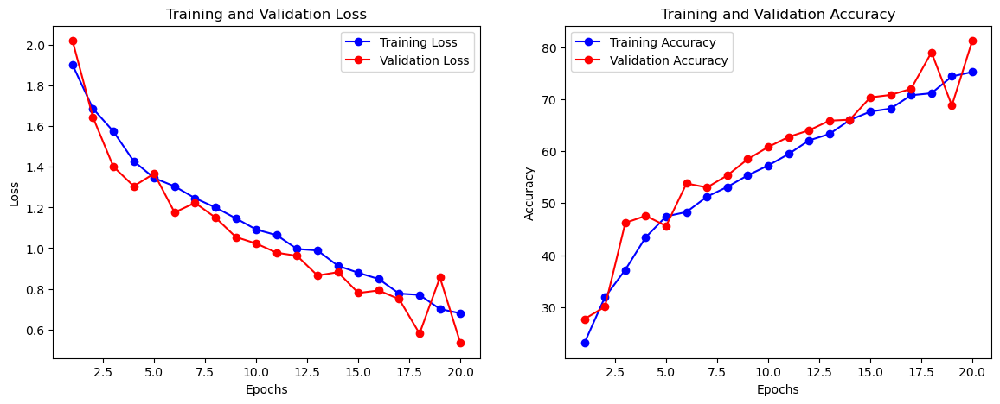

In [11]:
plot_training_history(history)

In [14]:
history

{'train_loss': [1.9025968442926753,
  1.6871299663355932,
  1.5747458094759925,
  1.4280931662401386,
  1.3451317224477857,
  1.304317519145926,
  1.246101736404735,
  1.2005392566246071,
  1.146930660608519,
  1.0915816111268157,
  1.0641942116880665,
  0.9958703642990923,
  0.988984642405584,
  0.9136573712442823,
  0.8790445662841896,
  0.8484132819533966,
  0.7766201176482779,
  0.770443347992057,
  0.700670217757398,
  0.6795798699936101],
 'val_loss': [2.0205143158252423,
  1.644551536670098,
  1.4014622266475971,
  1.305210609619434,
  1.3671206038731796,
  1.175792174614393,
  1.2230036759605774,
  1.1507601239360297,
  1.0549227191851689,
  1.02286960207499,
  0.9777576400683476,
  0.9624223644916828,
  0.8656573083538276,
  0.8820612497054614,
  0.7796521077935512,
  0.7921823078623185,
  0.7494459535066899,
  0.5797451637685299,
  0.8557725256022353,
  0.5339615162175435],
 'train_accuracy': [23.12925170068027,
  31.9080012957564,
  37.188208616780045,
  43.440233236151606,


In [9]:
resnet50 = torch.load("./models_weights/resnet50/best_model.pth")

C:\Users\001\AppData\Local\Temp\ipykernel_57784\1889212041.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet50 = torch.load("./models_weights/resnet50/best_model.pt

In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
optimizer = torch.optim.Adam(resnet50.parameters(), lr=0.001, weight_decay=0.0001)
train_class_weights_norm_tensor = torch.tensor(list(train_class_weights_norm.values())).to(device)
criterion = nn.CrossEntropyLoss(weight=train_class_weights_norm_tensor)

In [13]:
history = train(
    model=resnet50,
    optimizer=optimizer, 
    criterion=criterion, 
    train_loader=train_loader, 
    val_loader=val_loader, 
    num_epochs=40,
    start_epoch=20,
    device=device,
    models_weights_path="./models_weights/resnet50/best_model.pth",
    prev_best_min_loss=history["prev_best_min_loss"],
    prev_history=history)


Epoch 21/40
----------


100%|██████████| 193/193 [00:17<00:00, 11.11it/s]


Train Loss: 0.6301, Accuracy: 76.84%, Precision: 0.7681, Recall: 0.7684, F1 Score: 0.7670


100%|██████████| 65/65 [00:07<00:00,  8.15it/s]


Val Loss: 0.7553, Accuracy: 72.08%, Precision: 0.7509, Recall: 0.7208, F1 Score: 0.7166
--------------------------------------------------
Epoch 22/40
----------


100%|██████████| 193/193 [00:17<00:00, 10.82it/s]


Train Loss: 0.5689, Accuracy: 78.78%, Precision: 0.7876, Recall: 0.7878, F1 Score: 0.7870


100%|██████████| 65/65 [00:07<00:00,  8.47it/s]


Val Loss: 0.5779, Accuracy: 78.11%, Precision: 0.7975, Recall: 0.7811, F1 Score: 0.7753
--------------------------------------------------
Epoch 23/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.57it/s]


Train Loss: 0.5464, Accuracy: 80.05%, Precision: 0.8005, Recall: 0.8005, F1 Score: 0.7998


100%|██████████| 65/65 [00:07<00:00,  8.41it/s]


Val Loss: 1.1416, Accuracy: 65.76%, Precision: 0.7968, Recall: 0.6576, F1 Score: 0.6397
--------------------------------------------------
Epoch 24/40
----------


100%|██████████| 193/193 [00:17<00:00, 11.24it/s]


Train Loss: 0.5152, Accuracy: 81.24%, Precision: 0.8125, Recall: 0.8124, F1 Score: 0.8120


100%|██████████| 65/65 [00:08<00:00,  7.74it/s]


Val Loss: 0.5315, Accuracy: 80.16%, Precision: 0.8061, Recall: 0.8016, F1 Score: 0.7999
--------------------------------------------------
Best model saved with Val Loss: 0.5315
Epoch 25/40
----------


100%|██████████| 193/193 [00:17<00:00, 11.14it/s]


Train Loss: 0.4731, Accuracy: 82.31%, Precision: 0.8227, Recall: 0.8231, F1 Score: 0.8224


100%|██████████| 65/65 [00:07<00:00,  8.40it/s]


Val Loss: 0.5049, Accuracy: 82.59%, Precision: 0.8480, Recall: 0.8259, F1 Score: 0.8267
--------------------------------------------------
Best model saved with Val Loss: 0.5049
Epoch 26/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.39it/s]


Train Loss: 0.4552, Accuracy: 83.45%, Precision: 0.8341, Recall: 0.8345, F1 Score: 0.8341


100%|██████████| 65/65 [00:07<00:00,  8.37it/s]


Val Loss: 0.4905, Accuracy: 82.49%, Precision: 0.8464, Recall: 0.8249, F1 Score: 0.8242
--------------------------------------------------
Best model saved with Val Loss: 0.4905
Epoch 27/40
----------


100%|██████████| 193/193 [00:17<00:00, 11.26it/s]


Train Loss: 0.4217, Accuracy: 84.74%, Precision: 0.8476, Recall: 0.8474, F1 Score: 0.8471


100%|██████████| 65/65 [00:07<00:00,  8.39it/s]


Val Loss: 0.5094, Accuracy: 81.91%, Precision: 0.8352, Recall: 0.8191, F1 Score: 0.8168
--------------------------------------------------
Epoch 28/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.46it/s]


Train Loss: 0.3952, Accuracy: 86.01%, Precision: 0.8604, Recall: 0.8601, F1 Score: 0.8598


100%|██████████| 65/65 [00:07<00:00,  8.40it/s]


Val Loss: 0.4176, Accuracy: 85.02%, Precision: 0.8611, Recall: 0.8502, F1 Score: 0.8510
--------------------------------------------------
Best model saved with Val Loss: 0.4176
Epoch 29/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.38it/s]


Train Loss: 0.3814, Accuracy: 86.23%, Precision: 0.8620, Recall: 0.8623, F1 Score: 0.8619


100%|██████████| 65/65 [00:07<00:00,  8.37it/s]


Val Loss: 0.5994, Accuracy: 79.09%, Precision: 0.8302, Recall: 0.7909, F1 Score: 0.7907
--------------------------------------------------
Epoch 30/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.50it/s]


Train Loss: 0.3607, Accuracy: 86.91%, Precision: 0.8691, Recall: 0.8691, F1 Score: 0.8687


100%|██████████| 65/65 [00:08<00:00,  7.72it/s]


Val Loss: 0.4446, Accuracy: 83.95%, Precision: 0.8479, Recall: 0.8395, F1 Score: 0.8375
--------------------------------------------------
Epoch 31/40
----------


100%|██████████| 193/193 [00:17<00:00, 11.14it/s]


Train Loss: 0.3880, Accuracy: 85.78%, Precision: 0.8575, Recall: 0.8578, F1 Score: 0.8573


100%|██████████| 65/65 [00:07<00:00,  8.52it/s]


Val Loss: 0.3525, Accuracy: 87.35%, Precision: 0.8912, Recall: 0.8735, F1 Score: 0.8747
--------------------------------------------------
Best model saved with Val Loss: 0.3525
Epoch 32/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.52it/s]


Train Loss: 0.3282, Accuracy: 88.18%, Precision: 0.8818, Recall: 0.8818, F1 Score: 0.8816


100%|██████████| 65/65 [00:07<00:00,  8.43it/s]


Val Loss: 0.4485, Accuracy: 83.95%, Precision: 0.8670, Recall: 0.8395, F1 Score: 0.8405
--------------------------------------------------
Epoch 33/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.47it/s]


Train Loss: 0.2818, Accuracy: 89.12%, Precision: 0.8911, Recall: 0.8912, F1 Score: 0.8908


100%|██████████| 65/65 [00:07<00:00,  8.59it/s]


Val Loss: 0.2500, Accuracy: 91.44%, Precision: 0.9187, Recall: 0.9144, F1 Score: 0.9142
--------------------------------------------------
Best model saved with Val Loss: 0.2500
Epoch 34/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.40it/s]


Train Loss: 0.2674, Accuracy: 90.77%, Precision: 0.9078, Recall: 0.9077, F1 Score: 0.9076


100%|██████████| 65/65 [00:07<00:00,  8.60it/s]


Val Loss: 0.5082, Accuracy: 83.37%, Precision: 0.8548, Recall: 0.8337, F1 Score: 0.8341
--------------------------------------------------
Epoch 35/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.48it/s]


Train Loss: 0.2850, Accuracy: 90.18%, Precision: 0.9018, Recall: 0.9018, F1 Score: 0.9018


100%|██████████| 65/65 [00:07<00:00,  8.37it/s]


Val Loss: 0.4094, Accuracy: 85.41%, Precision: 0.8713, Recall: 0.8541, F1 Score: 0.8531
--------------------------------------------------
Epoch 36/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.46it/s]


Train Loss: 0.2910, Accuracy: 89.47%, Precision: 0.8948, Recall: 0.8947, F1 Score: 0.8947


100%|██████████| 65/65 [00:07<00:00,  8.40it/s]


Val Loss: 0.2884, Accuracy: 89.49%, Precision: 0.8999, Recall: 0.8949, F1 Score: 0.8946
--------------------------------------------------
Epoch 37/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.48it/s]


Train Loss: 0.2762, Accuracy: 90.28%, Precision: 0.9027, Recall: 0.9028, F1 Score: 0.9025


100%|██████████| 65/65 [00:07<00:00,  8.57it/s]


Val Loss: 0.3902, Accuracy: 86.96%, Precision: 0.8830, Recall: 0.8696, F1 Score: 0.8665
--------------------------------------------------
Epoch 38/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.48it/s]


Train Loss: 0.2739, Accuracy: 90.44%, Precision: 0.9046, Recall: 0.9044, F1 Score: 0.9043


100%|██████████| 65/65 [00:07<00:00,  8.57it/s]


Val Loss: 0.2482, Accuracy: 91.54%, Precision: 0.9216, Recall: 0.9154, F1 Score: 0.9160
--------------------------------------------------
Best model saved with Val Loss: 0.2482
Epoch 39/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.50it/s]


Train Loss: 0.2331, Accuracy: 91.97%, Precision: 0.9198, Recall: 0.9197, F1 Score: 0.9196


100%|██████████| 65/65 [00:08<00:00,  8.01it/s]


Val Loss: 0.2594, Accuracy: 91.63%, Precision: 0.9190, Recall: 0.9163, F1 Score: 0.9158
--------------------------------------------------
Epoch 40/40
----------


100%|██████████| 193/193 [00:16<00:00, 11.37it/s]


Train Loss: 0.2146, Accuracy: 92.39%, Precision: 0.9239, Recall: 0.9239, F1 Score: 0.9238


100%|██████████| 65/65 [00:08<00:00,  7.95it/s]

Val Loss: 0.2428, Accuracy: 91.25%, Precision: 0.9217, Recall: 0.9125, F1 Score: 0.9125
--------------------------------------------------
Best model saved with Val Loss: 0.2428
Finished Training


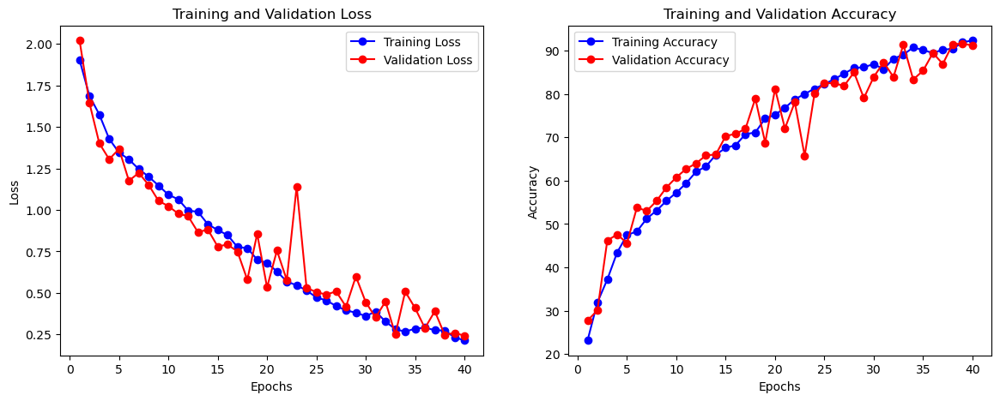

In [14]:
plot_training_history(history)

In [15]:
history

{'train_loss': [1.9025968442926753,
  1.6871299663355932,
  1.5747458094759925,
  1.4280931662401386,
  1.3451317224477857,
  1.304317519145926,
  1.246101736404735,
  1.2005392566246071,
  1.146930660608519,
  1.0915816111268157,
  1.0641942116880665,
  0.9958703642990923,
  0.988984642405584,
  0.9136573712442823,
  0.8790445662841896,
  0.8484132819533966,
  0.7766201176482779,
  0.770443347992057,
  0.700670217757398,
  0.6795798699936101,
  0.6301494317196812,
  0.5688744743253283,
  0.5463763035331983,
  0.5151677030510236,
  0.47313633939453975,
  0.4551805716799331,
  0.42166392211778175,
  0.39523974752024665,
  0.3813658707191289,
  0.36067384106970823,
  0.3879551403610509,
  0.3281922102206112,
  0.28178049840148867,
  0.2673544610025351,
  0.284989460231495,
  0.29101675514305503,
  0.27621970761934095,
  0.27388907989265077,
  0.23309364302054897,
  0.21464848662654198],
 'val_loss': [2.0205143158252423,
  1.644551536670098,
  1.4014622266475971,
  1.305210609619434,
  1.

In [18]:
history = train(
    model=resnet50,
    optimizer=optimizer, 
    criterion=criterion, 
    train_loader=train_loader, 
    val_loader=val_loader, 
    num_epochs=60,
    start_epoch=40,
    device=device,
    models_weights_path="./models_weights/resnet50/best_model.pth",
    prev_best_min_loss=history["prev_best_min_loss"],
    prev_history=history)

Epoch 41/60
----------


100%|██████████| 193/193 [00:17<00:00, 11.29it/s]


Train Loss: 0.2554, Accuracy: 90.67%, Precision: 0.9068, Recall: 0.9067, F1 Score: 0.9066


100%|██████████| 65/65 [00:07<00:00,  8.19it/s]


Val Loss: 0.3964, Accuracy: 85.99%, Precision: 0.8836, Recall: 0.8599, F1 Score: 0.8606
--------------------------------------------------
Epoch 42/60
----------


100%|██████████| 193/193 [00:17<00:00, 11.15it/s]


Train Loss: 0.1960, Accuracy: 92.71%, Precision: 0.9272, Recall: 0.9271, F1 Score: 0.9270


100%|██████████| 65/65 [00:07<00:00,  8.50it/s]


Val Loss: 0.2215, Accuracy: 92.70%, Precision: 0.9294, Recall: 0.9270, F1 Score: 0.9268
--------------------------------------------------
Best model saved with Val Loss: 0.2215
Epoch 43/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.59it/s]


Train Loss: 0.2338, Accuracy: 91.29%, Precision: 0.9129, Recall: 0.9129, F1 Score: 0.9128


100%|██████████| 65/65 [00:07<00:00,  8.50it/s]


Val Loss: 0.2988, Accuracy: 88.81%, Precision: 0.8994, Recall: 0.8881, F1 Score: 0.8870
--------------------------------------------------
Epoch 44/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.52it/s]


Train Loss: 0.2381, Accuracy: 91.32%, Precision: 0.9131, Recall: 0.9132, F1 Score: 0.9131


100%|██████████| 65/65 [00:08<00:00,  8.06it/s]


Val Loss: 0.2126, Accuracy: 92.51%, Precision: 0.9281, Recall: 0.9251, F1 Score: 0.9251
--------------------------------------------------
Best model saved with Val Loss: 0.2126
Epoch 45/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.52it/s]


Train Loss: 0.1888, Accuracy: 93.81%, Precision: 0.9382, Recall: 0.9381, F1 Score: 0.9381


100%|██████████| 65/65 [00:07<00:00,  8.66it/s]


Val Loss: 0.3147, Accuracy: 88.52%, Precision: 0.8963, Recall: 0.8852, F1 Score: 0.8798
--------------------------------------------------
Epoch 46/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.58it/s]


Train Loss: 0.1561, Accuracy: 95.17%, Precision: 0.9518, Recall: 0.9517, F1 Score: 0.9517


100%|██████████| 65/65 [00:07<00:00,  8.41it/s]


Val Loss: 0.2597, Accuracy: 91.05%, Precision: 0.9191, Recall: 0.9105, F1 Score: 0.9104
--------------------------------------------------
Epoch 47/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.56it/s]


Train Loss: 0.2117, Accuracy: 92.91%, Precision: 0.9292, Recall: 0.9291, F1 Score: 0.9290


100%|██████████| 65/65 [00:07<00:00,  8.47it/s]


Val Loss: 0.2697, Accuracy: 90.37%, Precision: 0.9165, Recall: 0.9037, F1 Score: 0.9023
--------------------------------------------------
Epoch 48/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.55it/s]


Train Loss: 0.1841, Accuracy: 93.68%, Precision: 0.9373, Recall: 0.9368, F1 Score: 0.9368


100%|██████████| 65/65 [00:07<00:00,  8.49it/s]


Val Loss: 0.3034, Accuracy: 90.66%, Precision: 0.9140, Recall: 0.9066, F1 Score: 0.9067
--------------------------------------------------
Epoch 49/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.56it/s]


Train Loss: 0.1571, Accuracy: 94.56%, Precision: 0.9455, Recall: 0.9456, F1 Score: 0.9454


100%|██████████| 65/65 [00:07<00:00,  8.43it/s]


Val Loss: 0.2182, Accuracy: 93.29%, Precision: 0.9416, Recall: 0.9329, F1 Score: 0.9338
--------------------------------------------------
Epoch 50/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.58it/s]


Train Loss: 0.1972, Accuracy: 92.97%, Precision: 0.9301, Recall: 0.9297, F1 Score: 0.9296


100%|██████████| 65/65 [00:07<00:00,  8.25it/s]


Val Loss: 0.1570, Accuracy: 94.84%, Precision: 0.9501, Recall: 0.9484, F1 Score: 0.9483
--------------------------------------------------
Best model saved with Val Loss: 0.1570
Epoch 51/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.61it/s]


Train Loss: 0.1865, Accuracy: 93.49%, Precision: 0.9350, Recall: 0.9349, F1 Score: 0.9349


100%|██████████| 65/65 [00:08<00:00,  8.04it/s]


Val Loss: 0.1370, Accuracy: 94.94%, Precision: 0.9525, Recall: 0.9494, F1 Score: 0.9497
--------------------------------------------------
Best model saved with Val Loss: 0.1370
Epoch 52/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.47it/s]


Train Loss: 0.1457, Accuracy: 95.14%, Precision: 0.9514, Recall: 0.9514, F1 Score: 0.9513


100%|██████████| 65/65 [00:07<00:00,  8.46it/s]


Val Loss: 0.2141, Accuracy: 92.02%, Precision: 0.9285, Recall: 0.9202, F1 Score: 0.9197
--------------------------------------------------
Epoch 53/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.70it/s]


Train Loss: 0.1572, Accuracy: 94.40%, Precision: 0.9442, Recall: 0.9440, F1 Score: 0.9440


100%|██████████| 65/65 [00:07<00:00,  8.48it/s]


Val Loss: 0.2591, Accuracy: 90.37%, Precision: 0.9125, Recall: 0.9037, F1 Score: 0.9038
--------------------------------------------------
Epoch 54/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.55it/s]


Train Loss: 0.1851, Accuracy: 93.49%, Precision: 0.9350, Recall: 0.9349, F1 Score: 0.9348


100%|██████████| 65/65 [00:07<00:00,  8.48it/s]


Val Loss: 0.1550, Accuracy: 94.75%, Precision: 0.9479, Recall: 0.9475, F1 Score: 0.9474
--------------------------------------------------
Epoch 55/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.69it/s]


Train Loss: 0.1361, Accuracy: 95.30%, Precision: 0.9531, Recall: 0.9530, F1 Score: 0.9530


100%|██████████| 65/65 [00:07<00:00,  8.47it/s]


Val Loss: 0.1747, Accuracy: 93.97%, Precision: 0.9426, Recall: 0.9397, F1 Score: 0.9396
--------------------------------------------------
Epoch 56/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.48it/s]


Train Loss: 0.1762, Accuracy: 94.43%, Precision: 0.9445, Recall: 0.9443, F1 Score: 0.9443


100%|██████████| 65/65 [00:07<00:00,  8.38it/s]


Val Loss: 0.3809, Accuracy: 87.55%, Precision: 0.8911, Recall: 0.8755, F1 Score: 0.8703
--------------------------------------------------
Epoch 57/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.45it/s]


Train Loss: 0.1566, Accuracy: 94.07%, Precision: 0.9407, Recall: 0.9407, F1 Score: 0.9406


100%|██████████| 65/65 [00:07<00:00,  8.37it/s]


Val Loss: 0.2078, Accuracy: 93.29%, Precision: 0.9362, Recall: 0.9329, F1 Score: 0.9326
--------------------------------------------------
Epoch 58/60
----------


100%|██████████| 193/193 [00:17<00:00, 11.35it/s]


Train Loss: 0.1203, Accuracy: 95.89%, Precision: 0.9590, Recall: 0.9589, F1 Score: 0.9589


100%|██████████| 65/65 [00:07<00:00,  8.17it/s]


Val Loss: 0.1852, Accuracy: 93.39%, Precision: 0.9419, Recall: 0.9339, F1 Score: 0.9342
--------------------------------------------------
Epoch 59/60
----------


100%|██████████| 193/193 [00:16<00:00, 11.60it/s]


Train Loss: 0.1394, Accuracy: 94.75%, Precision: 0.9474, Recall: 0.9475, F1 Score: 0.9474


100%|██████████| 65/65 [00:08<00:00,  7.76it/s]


Val Loss: 0.3076, Accuracy: 89.98%, Precision: 0.9078, Recall: 0.8998, F1 Score: 0.8995
--------------------------------------------------
Epoch 60/60
----------


100%|██████████| 193/193 [00:17<00:00, 11.24it/s]


Train Loss: 0.1667, Accuracy: 94.33%, Precision: 0.9433, Recall: 0.9433, F1 Score: 0.9433


100%|██████████| 65/65 [00:07<00:00,  8.17it/s]

Val Loss: 0.0896, Accuracy: 96.69%, Precision: 0.9673, Recall: 0.9669, F1 Score: 0.9669
--------------------------------------------------
Best model saved with Val Loss: 0.0896
Finished Training


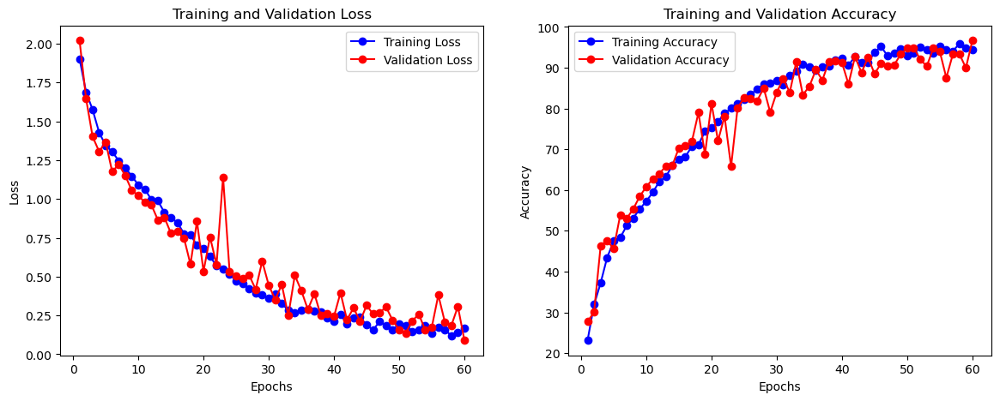

In [19]:
plot_training_history(history)

In [20]:
history

{'train_loss': [1.9025968442926753,
  1.6871299663355932,
  1.5747458094759925,
  1.4280931662401386,
  1.3451317224477857,
  1.304317519145926,
  1.246101736404735,
  1.2005392566246071,
  1.146930660608519,
  1.0915816111268157,
  1.0641942116880665,
  0.9958703642990923,
  0.988984642405584,
  0.9136573712442823,
  0.8790445662841896,
  0.8484132819533966,
  0.7766201176482779,
  0.770443347992057,
  0.700670217757398,
  0.6795798699936101,
  0.6301494317196812,
  0.5688744743253283,
  0.5463763035331983,
  0.5151677030510236,
  0.47313633939453975,
  0.4551805716799331,
  0.42166392211778175,
  0.39523974752024665,
  0.3813658707191289,
  0.36067384106970823,
  0.3879551403610509,
  0.3281922102206112,
  0.28178049840148867,
  0.2673544610025351,
  0.284989460231495,
  0.29101675514305503,
  0.27621970761934095,
  0.27388907989265077,
  0.23309364302054897,
  0.21464848662654198,
  0.255357666635992,
  0.1959588089716558,
  0.23384503397241313,
  0.23809757269918919,
  0.1888255492

In [23]:
history = train(
    model=resnet50,
    optimizer=optimizer, 
    criterion=criterion, 
    train_loader=train_loader, 
    val_loader=val_loader, 
    num_epochs=140,
    start_epoch=60,
    device=device,
    models_weights_path="./models_weights/resnet50/best_model.pth",
    prev_best_min_loss=history["prev_best_min_loss"],
    prev_history=history)

Epoch 61/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.46it/s]


Train Loss: 0.1203, Accuracy: 96.15%, Precision: 0.9615, Recall: 0.9615, F1 Score: 0.9614


100%|██████████| 65/65 [00:07<00:00,  8.24it/s]


Val Loss: 0.1472, Accuracy: 94.84%, Precision: 0.9536, Recall: 0.9484, F1 Score: 0.9485
--------------------------------------------------
Epoch 62/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.13it/s]


Train Loss: 0.1446, Accuracy: 94.40%, Precision: 0.9438, Recall: 0.9440, F1 Score: 0.9439


100%|██████████| 65/65 [00:08<00:00,  7.69it/s]


Val Loss: 0.2994, Accuracy: 90.18%, Precision: 0.9147, Recall: 0.9018, F1 Score: 0.9016
--------------------------------------------------
Epoch 63/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.28it/s]


Train Loss: 0.1674, Accuracy: 94.33%, Precision: 0.9435, Recall: 0.9433, F1 Score: 0.9433


100%|██████████| 65/65 [00:08<00:00,  7.85it/s]


Val Loss: 0.2604, Accuracy: 90.66%, Precision: 0.9197, Recall: 0.9066, F1 Score: 0.9070
--------------------------------------------------
Epoch 64/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.03it/s]


Train Loss: 0.1133, Accuracy: 96.02%, Precision: 0.9602, Recall: 0.9602, F1 Score: 0.9601


100%|██████████| 65/65 [00:08<00:00,  7.68it/s]


Val Loss: 0.1474, Accuracy: 95.04%, Precision: 0.9550, Recall: 0.9504, F1 Score: 0.9504
--------------------------------------------------
Epoch 65/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.14it/s]


Train Loss: 0.1204, Accuracy: 95.82%, Precision: 0.9584, Recall: 0.9582, F1 Score: 0.9582


100%|██████████| 65/65 [00:08<00:00,  8.05it/s]


Val Loss: 0.1636, Accuracy: 94.65%, Precision: 0.9495, Recall: 0.9465, F1 Score: 0.9459
--------------------------------------------------
Epoch 66/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.28it/s]


Train Loss: 0.1738, Accuracy: 94.33%, Precision: 0.9432, Recall: 0.9433, F1 Score: 0.9432


100%|██████████| 65/65 [00:07<00:00,  8.48it/s]


Val Loss: 0.1465, Accuracy: 94.94%, Precision: 0.9525, Recall: 0.9494, F1 Score: 0.9497
--------------------------------------------------
Epoch 67/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.27it/s]


Train Loss: 0.1482, Accuracy: 95.04%, Precision: 0.9507, Recall: 0.9504, F1 Score: 0.9505


100%|██████████| 65/65 [00:08<00:00,  7.88it/s]


Val Loss: 0.2280, Accuracy: 91.63%, Precision: 0.9297, Recall: 0.9163, F1 Score: 0.9172
--------------------------------------------------
Epoch 68/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.42it/s]


Train Loss: 0.1179, Accuracy: 95.95%, Precision: 0.9598, Recall: 0.9595, F1 Score: 0.9596


100%|██████████| 65/65 [00:07<00:00,  8.48it/s]


Val Loss: 0.1420, Accuracy: 95.62%, Precision: 0.9594, Recall: 0.9562, F1 Score: 0.9564
--------------------------------------------------
Epoch 69/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.13it/s]


Train Loss: 0.1047, Accuracy: 96.18%, Precision: 0.9618, Recall: 0.9618, F1 Score: 0.9617


100%|██████████| 65/65 [00:07<00:00,  8.49it/s]


Val Loss: 0.1524, Accuracy: 94.46%, Precision: 0.9486, Recall: 0.9446, F1 Score: 0.9446
--------------------------------------------------
Epoch 70/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.27it/s]


Train Loss: 0.0854, Accuracy: 97.05%, Precision: 0.9705, Recall: 0.9705, F1 Score: 0.9705


100%|██████████| 65/65 [00:07<00:00,  8.73it/s]


Val Loss: 0.2619, Accuracy: 92.02%, Precision: 0.9319, Recall: 0.9202, F1 Score: 0.9205
--------------------------------------------------
Epoch 71/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.40it/s]


Train Loss: 0.1386, Accuracy: 94.91%, Precision: 0.9492, Recall: 0.9491, F1 Score: 0.9492


100%|██████████| 65/65 [00:07<00:00,  8.47it/s]


Val Loss: 0.1687, Accuracy: 94.07%, Precision: 0.9425, Recall: 0.9407, F1 Score: 0.9409
--------------------------------------------------
Epoch 72/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.59it/s]


Train Loss: 0.1206, Accuracy: 95.72%, Precision: 0.9574, Recall: 0.9572, F1 Score: 0.9573


100%|██████████| 65/65 [00:07<00:00,  8.69it/s]


Val Loss: 0.1176, Accuracy: 96.30%, Precision: 0.9639, Recall: 0.9630, F1 Score: 0.9631
--------------------------------------------------
Epoch 73/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.57it/s]


Train Loss: 0.1018, Accuracy: 96.47%, Precision: 0.9647, Recall: 0.9647, F1 Score: 0.9647


100%|██████████| 65/65 [00:07<00:00,  8.51it/s]


Val Loss: 0.1206, Accuracy: 96.11%, Precision: 0.9644, Recall: 0.9611, F1 Score: 0.9615
--------------------------------------------------
Epoch 74/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.11it/s]


Train Loss: 0.1120, Accuracy: 95.59%, Precision: 0.9559, Recall: 0.9559, F1 Score: 0.9559


100%|██████████| 65/65 [00:07<00:00,  8.28it/s]


Val Loss: 0.1092, Accuracy: 95.72%, Precision: 0.9587, Recall: 0.9572, F1 Score: 0.9572
--------------------------------------------------
Epoch 75/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.40it/s]


Train Loss: 0.1159, Accuracy: 96.24%, Precision: 0.9625, Recall: 0.9624, F1 Score: 0.9624


100%|██████████| 65/65 [00:08<00:00,  8.04it/s]


Val Loss: 0.1437, Accuracy: 95.23%, Precision: 0.9567, Recall: 0.9523, F1 Score: 0.9523
--------------------------------------------------
Epoch 76/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.39it/s]


Train Loss: 0.1308, Accuracy: 95.14%, Precision: 0.9515, Recall: 0.9514, F1 Score: 0.9514


100%|██████████| 65/65 [00:08<00:00,  8.10it/s]


Val Loss: 0.1176, Accuracy: 96.21%, Precision: 0.9632, Recall: 0.9621, F1 Score: 0.9622
--------------------------------------------------
Epoch 77/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.41it/s]


Train Loss: 0.1170, Accuracy: 96.11%, Precision: 0.9612, Recall: 0.9611, F1 Score: 0.9611


100%|██████████| 65/65 [00:07<00:00,  8.28it/s]


Val Loss: 0.0954, Accuracy: 96.30%, Precision: 0.9649, Recall: 0.9630, F1 Score: 0.9630
--------------------------------------------------
Epoch 78/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.02it/s]


Train Loss: 0.0895, Accuracy: 96.89%, Precision: 0.9690, Recall: 0.9689, F1 Score: 0.9689


100%|██████████| 65/65 [00:08<00:00,  8.06it/s]


Val Loss: 0.1776, Accuracy: 93.39%, Precision: 0.9419, Recall: 0.9339, F1 Score: 0.9339
--------------------------------------------------
Epoch 79/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.01it/s]


Train Loss: 0.1178, Accuracy: 95.76%, Precision: 0.9577, Recall: 0.9576, F1 Score: 0.9576


100%|██████████| 65/65 [00:08<00:00,  7.87it/s]


Val Loss: 0.1399, Accuracy: 94.84%, Precision: 0.9541, Recall: 0.9484, F1 Score: 0.9492
--------------------------------------------------
Epoch 80/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.27it/s]


Train Loss: 0.1459, Accuracy: 94.75%, Precision: 0.9475, Recall: 0.9475, F1 Score: 0.9475


100%|██████████| 65/65 [00:08<00:00,  8.08it/s]


Val Loss: 0.0968, Accuracy: 96.60%, Precision: 0.9666, Recall: 0.9660, F1 Score: 0.9658
--------------------------------------------------
Epoch 81/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.27it/s]


Train Loss: 0.0792, Accuracy: 97.51%, Precision: 0.9751, Recall: 0.9751, F1 Score: 0.9750


100%|██████████| 65/65 [00:07<00:00,  8.28it/s]


Val Loss: 0.1071, Accuracy: 96.01%, Precision: 0.9617, Recall: 0.9601, F1 Score: 0.9597
--------------------------------------------------
Epoch 82/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.23it/s]


Train Loss: 0.0817, Accuracy: 97.38%, Precision: 0.9738, Recall: 0.9738, F1 Score: 0.9738


100%|██████████| 65/65 [00:07<00:00,  8.58it/s]


Val Loss: 0.0792, Accuracy: 97.67%, Precision: 0.9773, Recall: 0.9767, F1 Score: 0.9767
--------------------------------------------------
Best model saved with Val Loss: 0.0792
Epoch 83/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.60it/s]


Train Loss: 0.0994, Accuracy: 96.53%, Precision: 0.9654, Recall: 0.9653, F1 Score: 0.9653


100%|██████████| 65/65 [00:07<00:00,  8.45it/s]


Val Loss: 0.1370, Accuracy: 95.04%, Precision: 0.9527, Recall: 0.9504, F1 Score: 0.9502
--------------------------------------------------
Epoch 84/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.26it/s]


Train Loss: 0.1371, Accuracy: 94.75%, Precision: 0.9475, Recall: 0.9475, F1 Score: 0.9475


100%|██████████| 65/65 [00:07<00:00,  8.53it/s]


Val Loss: 0.2122, Accuracy: 92.41%, Precision: 0.9297, Recall: 0.9241, F1 Score: 0.9241
--------------------------------------------------
Epoch 85/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.55it/s]


Train Loss: 0.1183, Accuracy: 95.46%, Precision: 0.9546, Recall: 0.9546, F1 Score: 0.9546


100%|██████████| 65/65 [00:07<00:00,  8.28it/s]


Val Loss: 0.1519, Accuracy: 94.36%, Precision: 0.9478, Recall: 0.9436, F1 Score: 0.9434
--------------------------------------------------
Epoch 86/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.41it/s]


Train Loss: 0.1214, Accuracy: 95.92%, Precision: 0.9593, Recall: 0.9592, F1 Score: 0.9592


100%|██████████| 65/65 [00:07<00:00,  8.28it/s]


Val Loss: 0.1793, Accuracy: 93.48%, Precision: 0.9391, Recall: 0.9348, F1 Score: 0.9349
--------------------------------------------------
Epoch 87/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.39it/s]


Train Loss: 0.0843, Accuracy: 97.02%, Precision: 0.9702, Recall: 0.9702, F1 Score: 0.9702


100%|██████████| 65/65 [00:07<00:00,  8.32it/s]


Val Loss: 0.1770, Accuracy: 94.46%, Precision: 0.9500, Recall: 0.9446, F1 Score: 0.9447
--------------------------------------------------
Epoch 88/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.38it/s]


Train Loss: 0.1068, Accuracy: 96.24%, Precision: 0.9625, Recall: 0.9624, F1 Score: 0.9624


100%|██████████| 65/65 [00:07<00:00,  8.70it/s]


Val Loss: 0.1322, Accuracy: 94.94%, Precision: 0.9534, Recall: 0.9494, F1 Score: 0.9493
--------------------------------------------------
Epoch 89/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.14it/s]


Train Loss: 0.0958, Accuracy: 96.47%, Precision: 0.9647, Recall: 0.9647, F1 Score: 0.9647


100%|██████████| 65/65 [00:07<00:00,  8.28it/s]


Val Loss: 0.1119, Accuracy: 95.62%, Precision: 0.9568, Recall: 0.9562, F1 Score: 0.9561
--------------------------------------------------
Epoch 90/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.29it/s]


Train Loss: 0.0961, Accuracy: 96.92%, Precision: 0.9693, Recall: 0.9692, F1 Score: 0.9692


100%|██████████| 65/65 [00:07<00:00,  8.23it/s]


Val Loss: 0.1181, Accuracy: 95.91%, Precision: 0.9600, Recall: 0.9591, F1 Score: 0.9591
--------------------------------------------------
Epoch 91/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.54it/s]


Train Loss: 0.0957, Accuracy: 97.05%, Precision: 0.9706, Recall: 0.9705, F1 Score: 0.9705


100%|██████████| 65/65 [00:07<00:00,  8.28it/s]


Val Loss: 0.1382, Accuracy: 95.43%, Precision: 0.9560, Recall: 0.9543, F1 Score: 0.9541
--------------------------------------------------
Epoch 92/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.29it/s]


Train Loss: 0.0999, Accuracy: 96.79%, Precision: 0.9680, Recall: 0.9679, F1 Score: 0.9679


100%|██████████| 65/65 [00:07<00:00,  8.48it/s]


Val Loss: 0.1479, Accuracy: 95.04%, Precision: 0.9523, Recall: 0.9504, F1 Score: 0.9504
--------------------------------------------------
Epoch 93/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.13it/s]


Train Loss: 0.1059, Accuracy: 96.47%, Precision: 0.9648, Recall: 0.9647, F1 Score: 0.9647


100%|██████████| 65/65 [00:07<00:00,  8.49it/s]


Val Loss: 0.1444, Accuracy: 94.65%, Precision: 0.9492, Recall: 0.9465, F1 Score: 0.9465
--------------------------------------------------
Epoch 94/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.28it/s]


Train Loss: 0.1103, Accuracy: 96.15%, Precision: 0.9615, Recall: 0.9615, F1 Score: 0.9614


100%|██████████| 65/65 [00:08<00:00,  7.70it/s]


Val Loss: 0.1418, Accuracy: 95.23%, Precision: 0.9542, Recall: 0.9523, F1 Score: 0.9522
--------------------------------------------------
Epoch 95/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.02it/s]


Train Loss: 0.0994, Accuracy: 96.50%, Precision: 0.9651, Recall: 0.9650, F1 Score: 0.9650


100%|██████████| 65/65 [00:08<00:00,  8.03it/s]


Val Loss: 0.1253, Accuracy: 94.84%, Precision: 0.9510, Recall: 0.9484, F1 Score: 0.9480
--------------------------------------------------
Epoch 96/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.16it/s]


Train Loss: 0.0688, Accuracy: 97.51%, Precision: 0.9751, Recall: 0.9751, F1 Score: 0.9751


100%|██████████| 65/65 [00:07<00:00,  8.49it/s]


Val Loss: 0.0644, Accuracy: 98.15%, Precision: 0.9822, Recall: 0.9815, F1 Score: 0.9815
--------------------------------------------------
Best model saved with Val Loss: 0.0644
Epoch 97/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.62it/s]


Train Loss: 0.0911, Accuracy: 96.57%, Precision: 0.9658, Recall: 0.9657, F1 Score: 0.9657


100%|██████████| 65/65 [00:08<00:00,  7.83it/s]


Val Loss: 0.1055, Accuracy: 96.11%, Precision: 0.9625, Recall: 0.9611, F1 Score: 0.9609
--------------------------------------------------
Epoch 98/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.28it/s]


Train Loss: 0.0982, Accuracy: 96.34%, Precision: 0.9635, Recall: 0.9634, F1 Score: 0.9634


100%|██████████| 65/65 [00:08<00:00,  7.68it/s]


Val Loss: 0.0653, Accuracy: 97.57%, Precision: 0.9761, Recall: 0.9757, F1 Score: 0.9757
--------------------------------------------------
Epoch 99/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.16it/s]


Train Loss: 0.0804, Accuracy: 96.89%, Precision: 0.9689, Recall: 0.9689, F1 Score: 0.9689


100%|██████████| 65/65 [00:07<00:00,  8.48it/s]


Val Loss: 0.0955, Accuracy: 97.08%, Precision: 0.9714, Recall: 0.9708, F1 Score: 0.9706
--------------------------------------------------
Epoch 100/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.13it/s]


Train Loss: 0.0887, Accuracy: 96.83%, Precision: 0.9683, Recall: 0.9683, F1 Score: 0.9682


100%|██████████| 65/65 [00:07<00:00,  8.25it/s]


Val Loss: 0.0782, Accuracy: 97.28%, Precision: 0.9730, Recall: 0.9728, F1 Score: 0.9728
--------------------------------------------------
Epoch 101/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.04it/s]


Train Loss: 0.0988, Accuracy: 96.66%, Precision: 0.9668, Recall: 0.9666, F1 Score: 0.9666


100%|██████████| 65/65 [00:08<00:00,  8.06it/s]


Val Loss: 0.0565, Accuracy: 97.47%, Precision: 0.9750, Recall: 0.9747, F1 Score: 0.9746
--------------------------------------------------
Best model saved with Val Loss: 0.0565
Epoch 102/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.07it/s]


Train Loss: 0.1192, Accuracy: 95.92%, Precision: 0.9593, Recall: 0.9592, F1 Score: 0.9592


100%|██████████| 65/65 [00:07<00:00,  8.48it/s]


Val Loss: 0.1623, Accuracy: 94.26%, Precision: 0.9459, Recall: 0.9426, F1 Score: 0.9427
--------------------------------------------------
Epoch 103/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.27it/s]


Train Loss: 0.0954, Accuracy: 96.70%, Precision: 0.9671, Recall: 0.9670, F1 Score: 0.9670


100%|██████████| 65/65 [00:08<00:00,  7.67it/s]


Val Loss: 0.1243, Accuracy: 96.01%, Precision: 0.9603, Recall: 0.9601, F1 Score: 0.9600
--------------------------------------------------
Epoch 104/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.29it/s]


Train Loss: 0.0856, Accuracy: 97.05%, Precision: 0.9706, Recall: 0.9705, F1 Score: 0.9705


100%|██████████| 65/65 [00:08<00:00,  8.05it/s]


Val Loss: 0.2638, Accuracy: 90.76%, Precision: 0.9154, Recall: 0.9076, F1 Score: 0.9070
--------------------------------------------------
Epoch 105/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.42it/s]


Train Loss: 0.0713, Accuracy: 97.83%, Precision: 0.9783, Recall: 0.9783, F1 Score: 0.9783


100%|██████████| 65/65 [00:07<00:00,  8.49it/s]


Val Loss: 0.0583, Accuracy: 98.05%, Precision: 0.9809, Recall: 0.9805, F1 Score: 0.9805
--------------------------------------------------
Epoch 106/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.64it/s]


Train Loss: 0.0740, Accuracy: 97.64%, Precision: 0.9764, Recall: 0.9764, F1 Score: 0.9764


100%|██████████| 65/65 [00:08<00:00,  7.72it/s]


Val Loss: 0.0874, Accuracy: 96.79%, Precision: 0.9686, Recall: 0.9679, F1 Score: 0.9679
--------------------------------------------------
Epoch 107/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.27it/s]


Train Loss: 0.0623, Accuracy: 97.96%, Precision: 0.9796, Recall: 0.9796, F1 Score: 0.9796


100%|██████████| 65/65 [00:08<00:00,  8.10it/s]


Val Loss: 0.0769, Accuracy: 97.67%, Precision: 0.9769, Recall: 0.9767, F1 Score: 0.9766
--------------------------------------------------
Epoch 108/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.27it/s]


Train Loss: 0.0696, Accuracy: 97.38%, Precision: 0.9739, Recall: 0.9738, F1 Score: 0.9738


100%|██████████| 65/65 [00:07<00:00,  8.49it/s]


Val Loss: 0.1829, Accuracy: 93.97%, Precision: 0.9440, Recall: 0.9397, F1 Score: 0.9393
--------------------------------------------------
Epoch 109/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.28it/s]


Train Loss: 0.1067, Accuracy: 96.44%, Precision: 0.9645, Recall: 0.9644, F1 Score: 0.9644


100%|██████████| 65/65 [00:07<00:00,  8.24it/s]


Val Loss: 0.0521, Accuracy: 98.25%, Precision: 0.9828, Recall: 0.9825, F1 Score: 0.9824
--------------------------------------------------
Best model saved with Val Loss: 0.0521
Epoch 110/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.19it/s]


Train Loss: 0.1107, Accuracy: 96.11%, Precision: 0.9612, Recall: 0.9611, F1 Score: 0.9611


100%|██████████| 65/65 [00:08<00:00,  8.07it/s]


Val Loss: 0.1770, Accuracy: 93.58%, Precision: 0.9388, Recall: 0.9358, F1 Score: 0.9357
--------------------------------------------------
Epoch 111/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.14it/s]


Train Loss: 0.0861, Accuracy: 96.92%, Precision: 0.9692, Recall: 0.9692, F1 Score: 0.9692


100%|██████████| 65/65 [00:08<00:00,  7.86it/s]


Val Loss: 0.1312, Accuracy: 96.01%, Precision: 0.9609, Recall: 0.9601, F1 Score: 0.9601
--------------------------------------------------
Epoch 112/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.16it/s]


Train Loss: 0.0795, Accuracy: 97.05%, Precision: 0.9705, Recall: 0.9705, F1 Score: 0.9705


100%|██████████| 65/65 [00:07<00:00,  8.47it/s]


Val Loss: 0.1133, Accuracy: 96.11%, Precision: 0.9624, Recall: 0.9611, F1 Score: 0.9608
--------------------------------------------------
Epoch 113/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.14it/s]


Train Loss: 0.0900, Accuracy: 96.83%, Precision: 0.9683, Recall: 0.9683, F1 Score: 0.9682


100%|██████████| 65/65 [00:08<00:00,  7.70it/s]


Val Loss: 0.0985, Accuracy: 97.08%, Precision: 0.9717, Recall: 0.9708, F1 Score: 0.9705
--------------------------------------------------
Epoch 114/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.14it/s]


Train Loss: 0.0893, Accuracy: 96.70%, Precision: 0.9670, Recall: 0.9670, F1 Score: 0.9669


100%|██████████| 65/65 [00:07<00:00,  8.28it/s]


Val Loss: 0.1320, Accuracy: 95.14%, Precision: 0.9545, Recall: 0.9514, F1 Score: 0.9516
--------------------------------------------------
Epoch 115/140
----------


100%|██████████| 193/193 [00:17<00:00, 10.90it/s]


Train Loss: 0.0872, Accuracy: 97.08%, Precision: 0.9709, Recall: 0.9708, F1 Score: 0.9708


100%|██████████| 65/65 [00:07<00:00,  8.25it/s]


Val Loss: 0.1565, Accuracy: 94.26%, Precision: 0.9470, Recall: 0.9426, F1 Score: 0.9424
--------------------------------------------------
Epoch 116/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.28it/s]


Train Loss: 0.0926, Accuracy: 96.99%, Precision: 0.9699, Recall: 0.9699, F1 Score: 0.9699


100%|██████████| 65/65 [00:08<00:00,  8.04it/s]


Val Loss: 0.0757, Accuracy: 97.47%, Precision: 0.9750, Recall: 0.9747, F1 Score: 0.9746
--------------------------------------------------
Epoch 117/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.02it/s]


Train Loss: 0.0550, Accuracy: 98.12%, Precision: 0.9812, Recall: 0.9812, F1 Score: 0.9812


100%|██████████| 65/65 [00:08<00:00,  8.07it/s]


Val Loss: 0.0690, Accuracy: 97.96%, Precision: 0.9801, Recall: 0.9796, F1 Score: 0.9795
--------------------------------------------------
Epoch 118/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.27it/s]


Train Loss: 0.0420, Accuracy: 98.70%, Precision: 0.9871, Recall: 0.9870, F1 Score: 0.9871


100%|██████████| 65/65 [00:07<00:00,  8.50it/s]


Val Loss: 0.0417, Accuracy: 98.25%, Precision: 0.9829, Recall: 0.9825, F1 Score: 0.9824
--------------------------------------------------
Best model saved with Val Loss: 0.0417
Epoch 119/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.31it/s]


Train Loss: 0.0711, Accuracy: 97.57%, Precision: 0.9757, Recall: 0.9757, F1 Score: 0.9757


100%|██████████| 65/65 [00:07<00:00,  8.28it/s]


Val Loss: 0.0702, Accuracy: 97.76%, Precision: 0.9779, Recall: 0.9776, F1 Score: 0.9776
--------------------------------------------------
Epoch 120/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.15it/s]


Train Loss: 0.1187, Accuracy: 95.92%, Precision: 0.9593, Recall: 0.9592, F1 Score: 0.9592


100%|██████████| 65/65 [00:07<00:00,  8.24it/s]


Val Loss: 0.1421, Accuracy: 94.55%, Precision: 0.9471, Recall: 0.9455, F1 Score: 0.9454
--------------------------------------------------
Epoch 121/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.16it/s]


Train Loss: 0.0698, Accuracy: 97.60%, Precision: 0.9761, Recall: 0.9760, F1 Score: 0.9760


100%|██████████| 65/65 [00:08<00:00,  7.85it/s]


Val Loss: 0.0689, Accuracy: 97.47%, Precision: 0.9750, Recall: 0.9747, F1 Score: 0.9747
--------------------------------------------------
Epoch 122/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.03it/s]


Train Loss: 0.0807, Accuracy: 97.05%, Precision: 0.9706, Recall: 0.9705, F1 Score: 0.9705


100%|██████████| 65/65 [00:07<00:00,  8.25it/s]


Val Loss: 0.1280, Accuracy: 95.53%, Precision: 0.9560, Recall: 0.9553, F1 Score: 0.9553
--------------------------------------------------
Epoch 123/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.30it/s]


Train Loss: 0.0585, Accuracy: 97.76%, Precision: 0.9777, Recall: 0.9776, F1 Score: 0.9776


100%|██████████| 65/65 [00:07<00:00,  8.47it/s]


Val Loss: 0.3654, Accuracy: 88.72%, Precision: 0.9228, Recall: 0.8872, F1 Score: 0.8920
--------------------------------------------------
Epoch 124/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.15it/s]


Train Loss: 0.0831, Accuracy: 97.05%, Precision: 0.9705, Recall: 0.9705, F1 Score: 0.9705


100%|██████████| 65/65 [00:08<00:00,  7.85it/s]


Val Loss: 0.1233, Accuracy: 94.94%, Precision: 0.9534, Recall: 0.9494, F1 Score: 0.9498
--------------------------------------------------
Epoch 125/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.29it/s]


Train Loss: 0.0725, Accuracy: 97.73%, Precision: 0.9775, Recall: 0.9773, F1 Score: 0.9774


100%|██████████| 65/65 [00:07<00:00,  8.50it/s]


Val Loss: 0.1895, Accuracy: 93.00%, Precision: 0.9391, Recall: 0.9300, F1 Score: 0.9309
--------------------------------------------------
Epoch 126/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.20it/s]


Train Loss: 0.0622, Accuracy: 97.99%, Precision: 0.9799, Recall: 0.9799, F1 Score: 0.9799


100%|██████████| 65/65 [00:07<00:00,  8.13it/s]


Val Loss: 0.0625, Accuracy: 97.86%, Precision: 0.9794, Recall: 0.9786, F1 Score: 0.9787
--------------------------------------------------
Epoch 127/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.51it/s]


Train Loss: 0.0707, Accuracy: 97.51%, Precision: 0.9751, Recall: 0.9751, F1 Score: 0.9751


100%|██████████| 65/65 [00:08<00:00,  7.96it/s]


Val Loss: 0.0882, Accuracy: 96.98%, Precision: 0.9703, Recall: 0.9698, F1 Score: 0.9698
--------------------------------------------------
Epoch 128/140
----------


100%|██████████| 193/193 [00:17<00:00, 11.21it/s]


Train Loss: 0.0622, Accuracy: 97.76%, Precision: 0.9776, Recall: 0.9776, F1 Score: 0.9776


100%|██████████| 65/65 [00:07<00:00,  8.32it/s]


Val Loss: 0.1138, Accuracy: 96.11%, Precision: 0.9632, Recall: 0.9611, F1 Score: 0.9612
--------------------------------------------------
Epoch 129/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.68it/s]


Train Loss: 0.1255, Accuracy: 96.08%, Precision: 0.9610, Recall: 0.9608, F1 Score: 0.9609


100%|██████████| 65/65 [00:07<00:00,  8.34it/s]


Val Loss: 0.1918, Accuracy: 93.77%, Precision: 0.9414, Recall: 0.9377, F1 Score: 0.9373
--------------------------------------------------
Epoch 130/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.48it/s]


Train Loss: 0.0775, Accuracy: 97.34%, Precision: 0.9734, Recall: 0.9734, F1 Score: 0.9734


100%|██████████| 65/65 [00:07<00:00,  8.58it/s]


Val Loss: 0.0635, Accuracy: 97.47%, Precision: 0.9754, Recall: 0.9747, F1 Score: 0.9746
--------------------------------------------------
Epoch 131/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.55it/s]


Train Loss: 0.0549, Accuracy: 98.28%, Precision: 0.9829, Recall: 0.9828, F1 Score: 0.9828


100%|██████████| 65/65 [00:07<00:00,  8.45it/s]


Val Loss: 0.0997, Accuracy: 97.18%, Precision: 0.9735, Recall: 0.9718, F1 Score: 0.9718
--------------------------------------------------
Epoch 132/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.44it/s]


Train Loss: 0.0685, Accuracy: 97.80%, Precision: 0.9780, Recall: 0.9780, F1 Score: 0.9780


100%|██████████| 65/65 [00:07<00:00,  8.41it/s]


Val Loss: 0.1384, Accuracy: 95.23%, Precision: 0.9537, Recall: 0.9523, F1 Score: 0.9522
--------------------------------------------------
Epoch 133/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.39it/s]


Train Loss: 0.0951, Accuracy: 96.86%, Precision: 0.9686, Recall: 0.9686, F1 Score: 0.9686


100%|██████████| 65/65 [00:08<00:00,  8.10it/s]


Val Loss: 0.1784, Accuracy: 93.97%, Precision: 0.9425, Recall: 0.9397, F1 Score: 0.9394
--------------------------------------------------
Epoch 134/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.47it/s]


Train Loss: 0.0693, Accuracy: 97.80%, Precision: 0.9780, Recall: 0.9780, F1 Score: 0.9780


100%|██████████| 65/65 [00:07<00:00,  8.43it/s]


Val Loss: 0.0700, Accuracy: 97.96%, Precision: 0.9801, Recall: 0.9796, F1 Score: 0.9795
--------------------------------------------------
Epoch 135/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.56it/s]


Train Loss: 0.0358, Accuracy: 99.13%, Precision: 0.9913, Recall: 0.9913, F1 Score: 0.9913


100%|██████████| 65/65 [00:07<00:00,  8.46it/s]


Val Loss: 0.0233, Accuracy: 99.32%, Precision: 0.9933, Recall: 0.9932, F1 Score: 0.9932
--------------------------------------------------
Best model saved with Val Loss: 0.0233
Epoch 136/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.47it/s]


Train Loss: 0.0259, Accuracy: 99.25%, Precision: 0.9926, Recall: 0.9925, F1 Score: 0.9925


100%|██████████| 65/65 [00:07<00:00,  8.48it/s]


Val Loss: 0.0605, Accuracy: 98.54%, Precision: 0.9859, Recall: 0.9854, F1 Score: 0.9854
--------------------------------------------------
Epoch 137/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.58it/s]


Train Loss: 0.0698, Accuracy: 97.86%, Precision: 0.9786, Recall: 0.9786, F1 Score: 0.9786


100%|██████████| 65/65 [00:07<00:00,  8.62it/s]


Val Loss: 0.1680, Accuracy: 94.75%, Precision: 0.9548, Recall: 0.9475, F1 Score: 0.9487
--------------------------------------------------
Epoch 138/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.69it/s]


Train Loss: 0.1021, Accuracy: 96.79%, Precision: 0.9680, Recall: 0.9679, F1 Score: 0.9679


100%|██████████| 65/65 [00:07<00:00,  8.46it/s]


Val Loss: 0.0625, Accuracy: 97.67%, Precision: 0.9768, Recall: 0.9767, F1 Score: 0.9766
--------------------------------------------------
Epoch 139/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.59it/s]


Train Loss: 0.1131, Accuracy: 96.47%, Precision: 0.9647, Recall: 0.9647, F1 Score: 0.9647


100%|██████████| 65/65 [00:07<00:00,  8.45it/s]


Val Loss: 0.1026, Accuracy: 96.98%, Precision: 0.9700, Recall: 0.9698, F1 Score: 0.9699
--------------------------------------------------
Epoch 140/140
----------


100%|██████████| 193/193 [00:16<00:00, 11.71it/s]


Train Loss: 0.0787, Accuracy: 97.25%, Precision: 0.9725, Recall: 0.9725, F1 Score: 0.9725


100%|██████████| 65/65 [00:07<00:00,  8.64it/s]

Val Loss: 0.0833, Accuracy: 96.89%, Precision: 0.9702, Recall: 0.9689, F1 Score: 0.9690
--------------------------------------------------
Finished Training


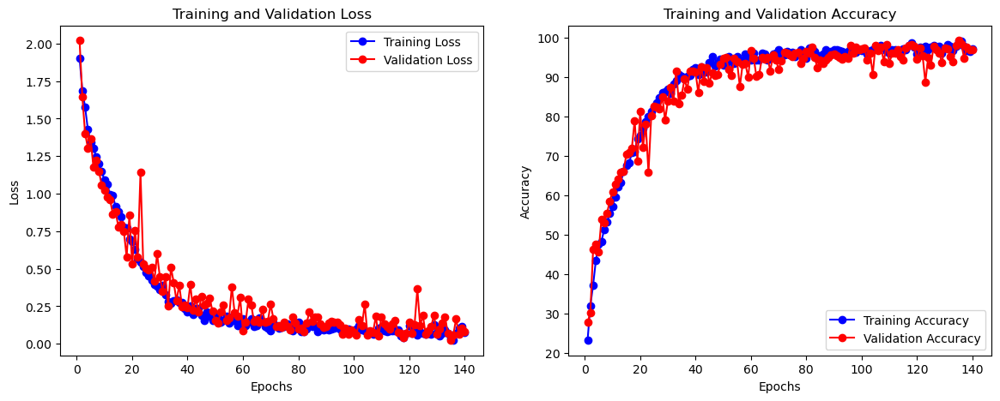

In [24]:
plot_training_history(history)

In [25]:
history

{'train_loss': [1.9025968442926753,
  1.6871299663355932,
  1.5747458094759925,
  1.4280931662401386,
  1.3451317224477857,
  1.304317519145926,
  1.246101736404735,
  1.2005392566246071,
  1.146930660608519,
  1.0915816111268157,
  1.0641942116880665,
  0.9958703642990923,
  0.988984642405584,
  0.9136573712442823,
  0.8790445662841896,
  0.8484132819533966,
  0.7766201176482779,
  0.770443347992057,
  0.700670217757398,
  0.6795798699936101,
  0.6301494317196812,
  0.5688744743253283,
  0.5463763035331983,
  0.5151677030510236,
  0.47313633939453975,
  0.4551805716799331,
  0.42166392211778175,
  0.39523974752024665,
  0.3813658707191289,
  0.36067384106970823,
  0.3879551403610509,
  0.3281922102206112,
  0.28178049840148867,
  0.2673544610025351,
  0.284989460231495,
  0.29101675514305503,
  0.27621970761934095,
  0.27388907989265077,
  0.23309364302054897,
  0.21464848662654198,
  0.255357666635992,
  0.1959588089716558,
  0.23384503397241313,
  0.23809757269918919,
  0.1888255492

In [28]:
torch.save(resnet50, "./models_weights/resnet50/final_model.pth")

## Evaluating

### Resnet18

In [7]:
final_model = torch.load("./models_weights/resnet18/final_model.pth")

C:\Users\001\AppData\Local\Temp\ipykernel_11740\3961852638.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  final_model = torch.load("./models_weights/resnet18/final_mode

100%|██████████| 65/65 [00:07<00:00,  8.78it/s]


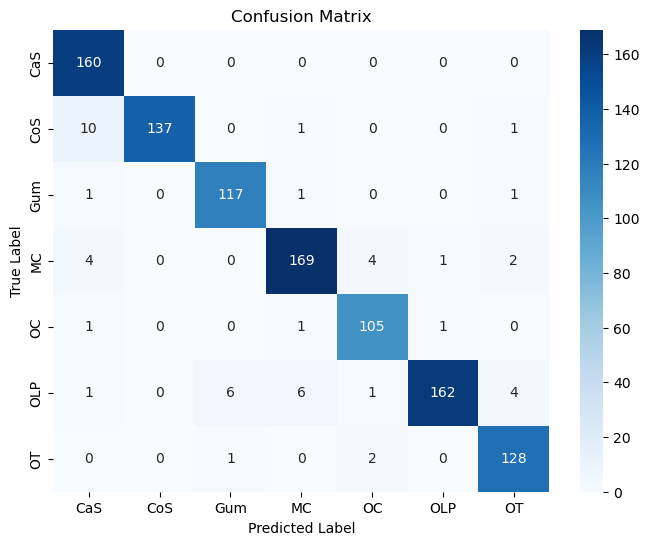

Average Loss: 0.1708
Accuracy: 95.1362
Precision: 0.9534
Recall: 0.9514
F1 Score: 0.9513


In [12]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# train_class_weights_norm_tensor = torch.tensor(list(train_class_weights_norm.values())).to(device)
criterion = nn.CrossEntropyLoss()
final_avg_loss, final_test_acc, final_test_prec, final_test_recall, final_test_f1 = evaluate(dataloader=test_loader, model=final_model, device=device, criterion=criterion, is_testing=True, class_names=test_dataset.classes)


In [33]:
# final_avg_loss, final_test_acc, final_test_prec, final_test_recall, final_test_f1

(0.17033182693322976,
 95.13618677042801,
 0.9534109405773624,
 0.9513618677042801,
 0.9512956473627326)

In [11]:
best_model = torch.load("./models_weights/resnet18/best_model.pth", weights_only=False)

best model

100%|██████████| 65/65 [00:07<00:00,  9.12it/s]


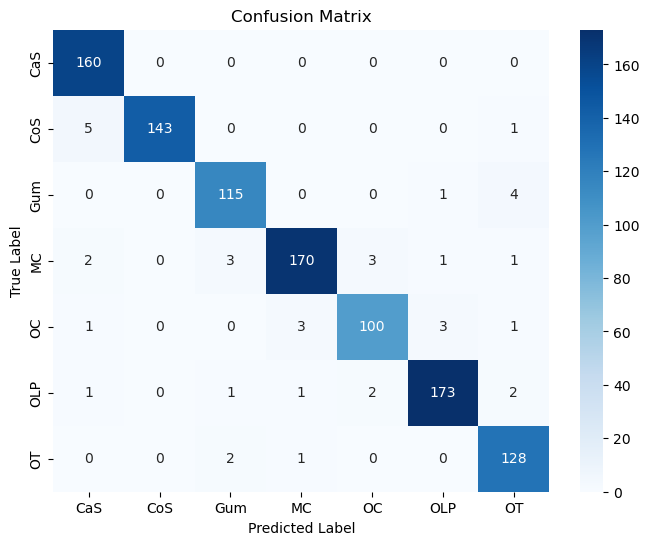

Average Loss: 0.1152
Accuracy: 96.2062
Precision: 0.9626
Recall: 0.9621
F1 Score: 0.9621


In [14]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion = nn.CrossEntropyLoss()
best_avg_loss, best_test_acc, best_test_prec, best_test_recall, best_test_f1 = evaluate(dataloader=test_loader, model=best_model, device=device, criterion=criterion, is_testing=True, class_names=test_dataset.classes)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


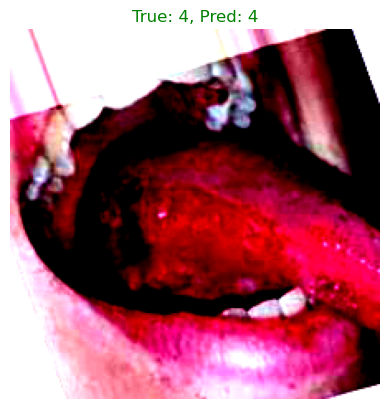

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


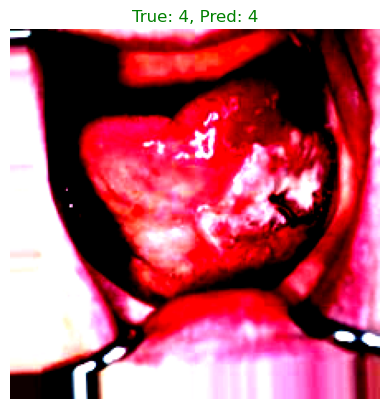

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


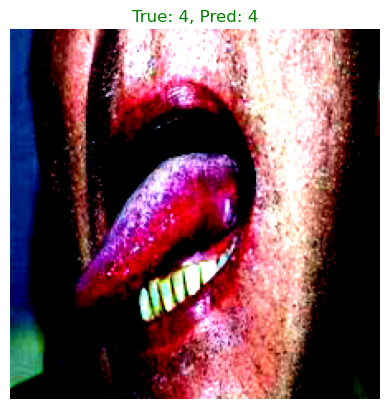

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


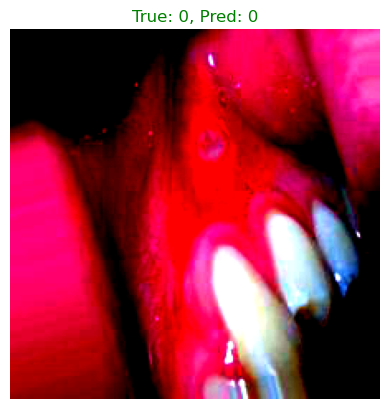

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


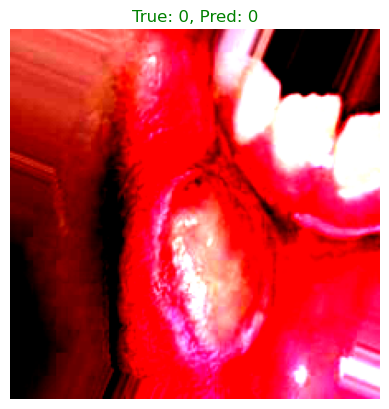

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


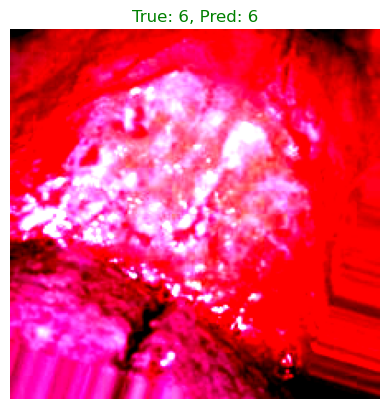

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


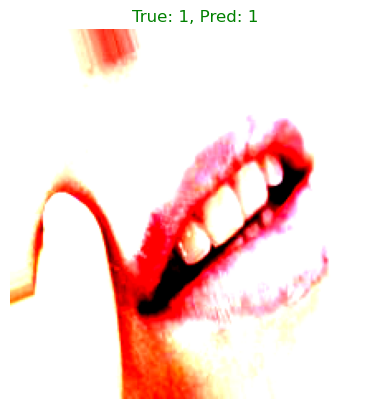

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


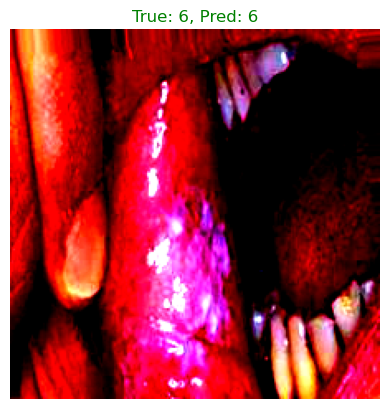

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


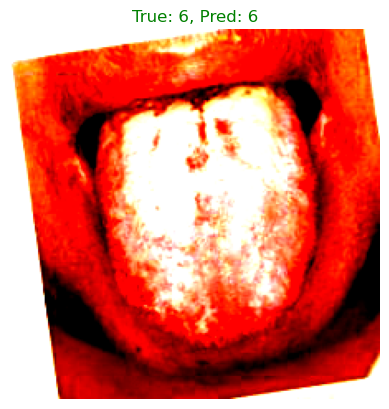

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


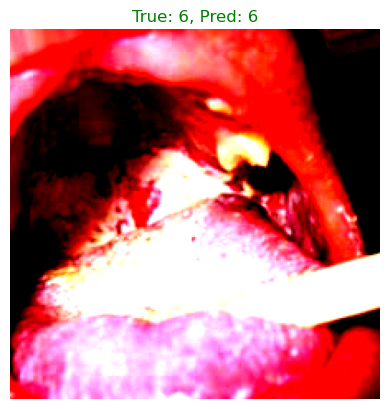

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


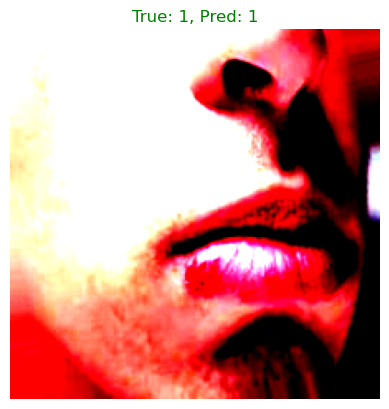

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


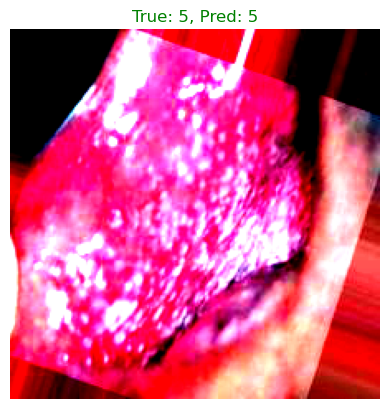

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


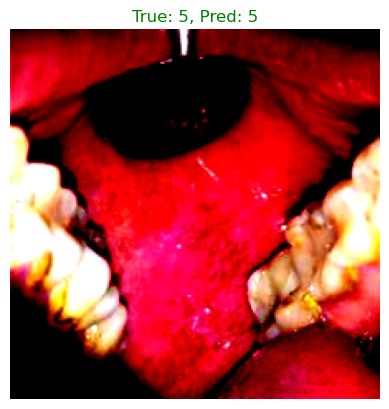

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


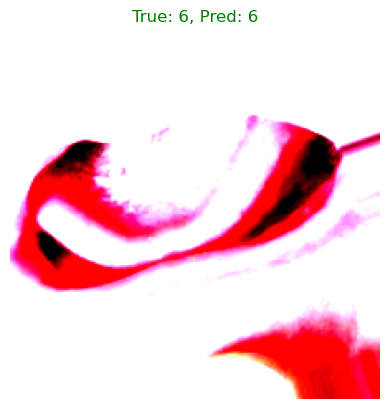

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


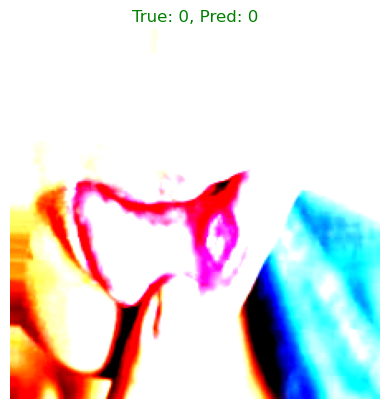

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


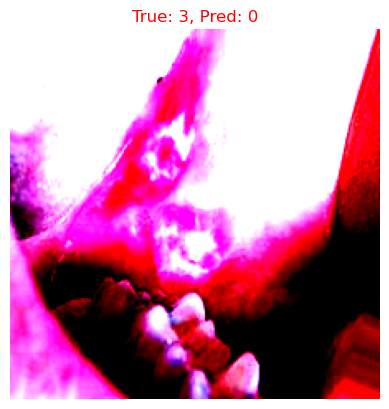

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


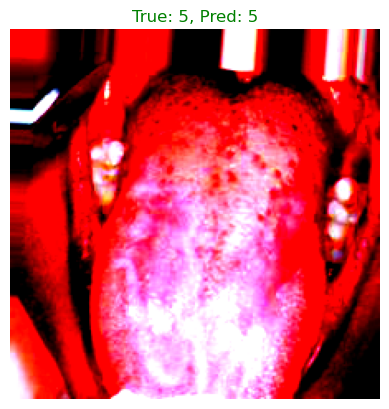

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


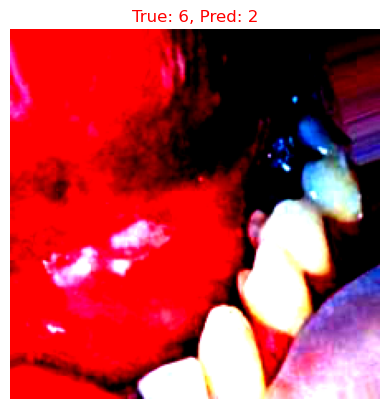

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


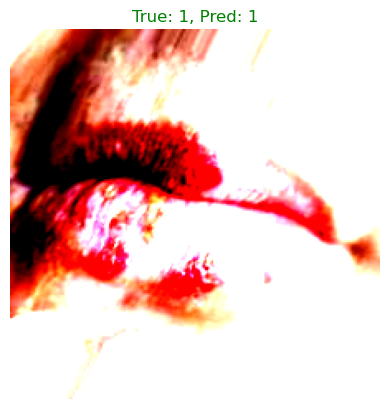

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


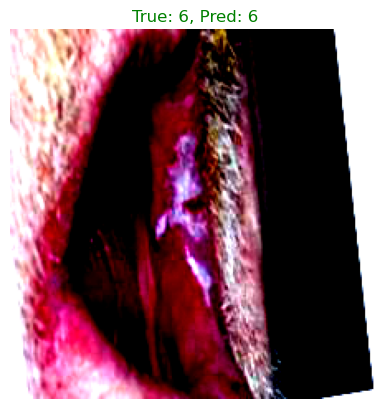

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


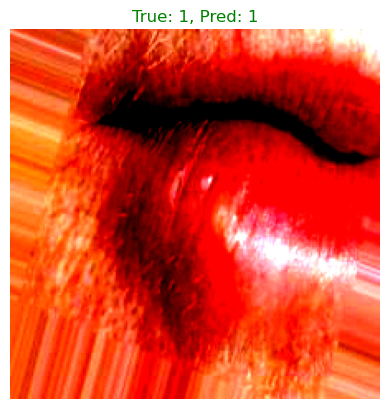

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


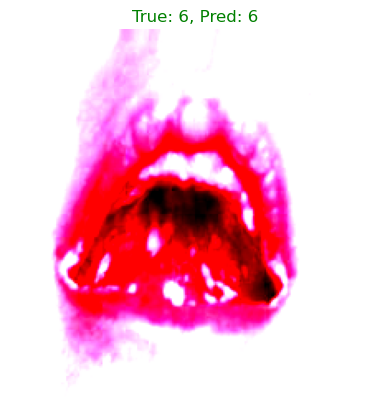

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


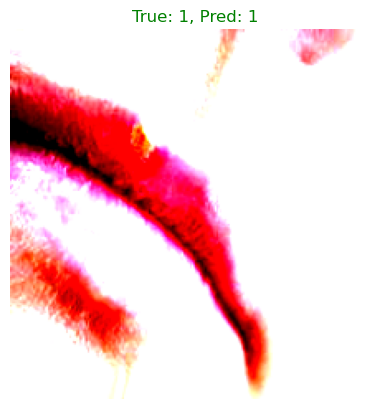

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


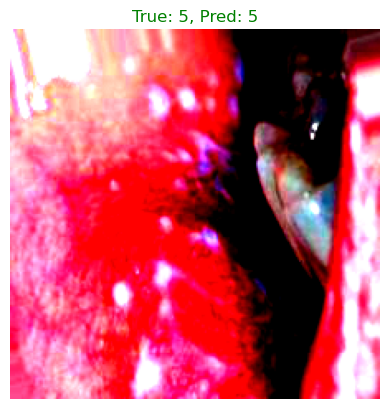

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


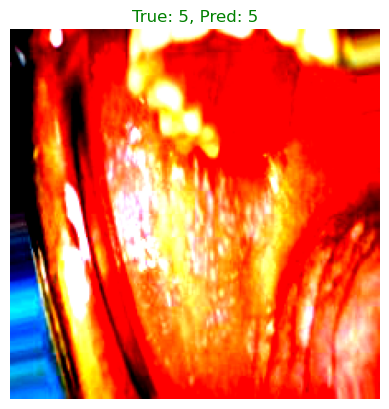

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


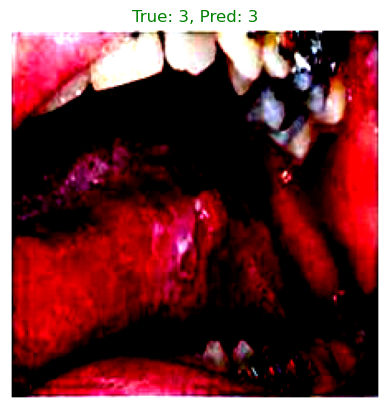

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


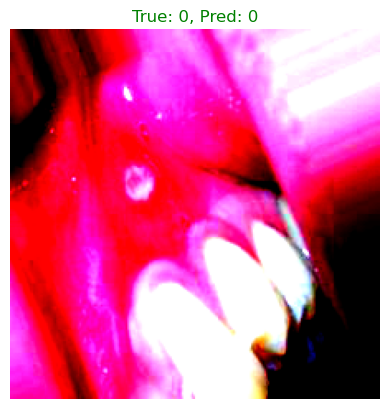

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


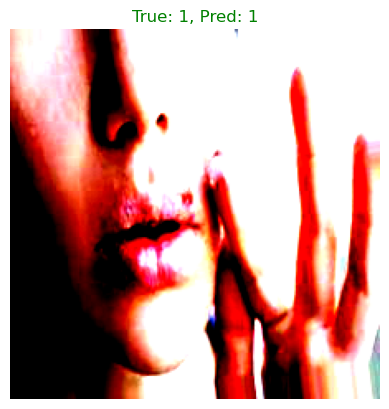

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


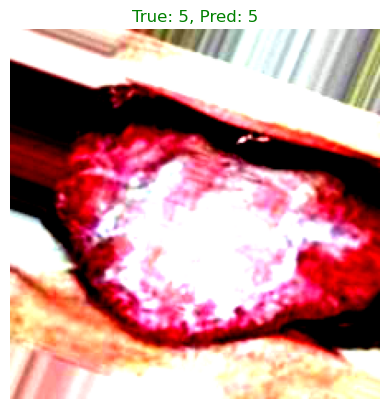

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


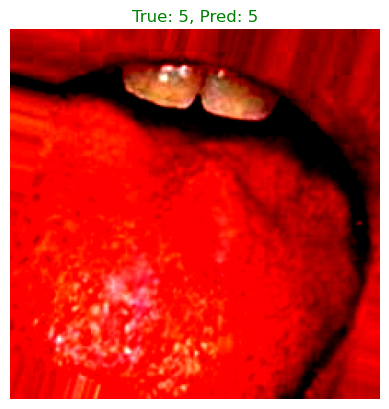

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


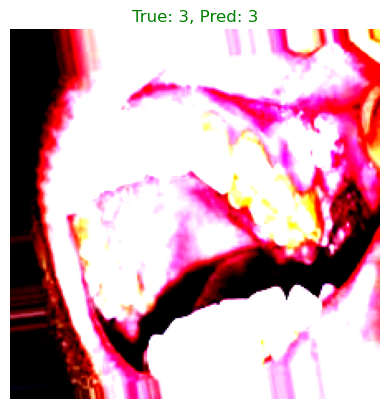

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


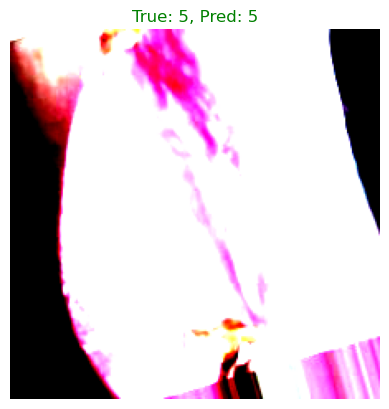

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


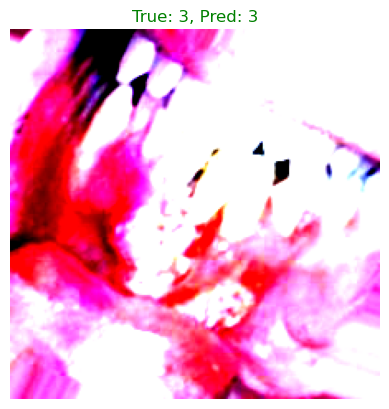

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


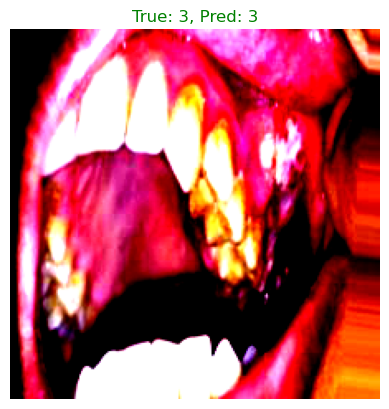

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


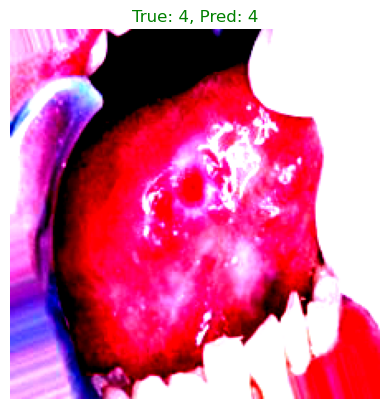

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


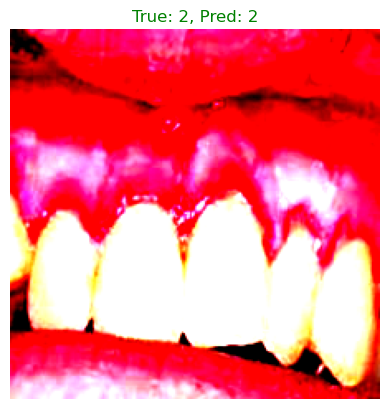

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


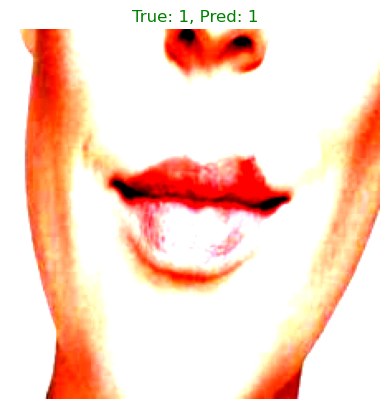

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


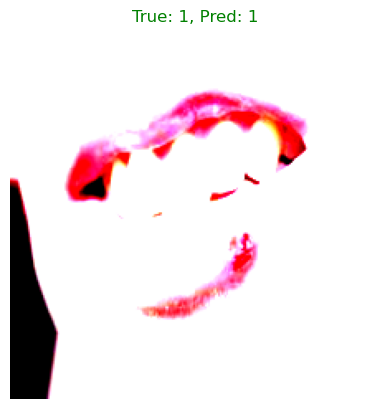

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


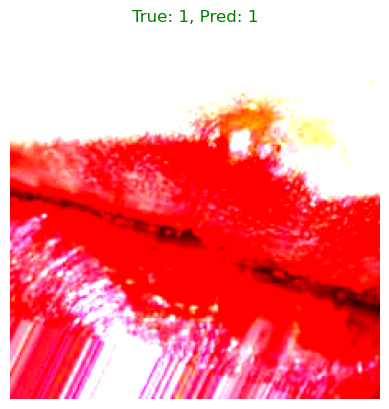

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


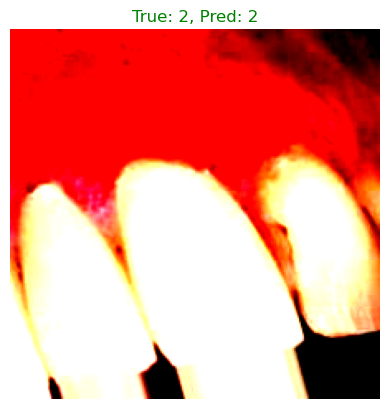

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


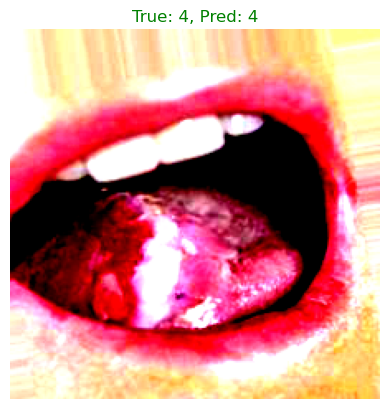

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


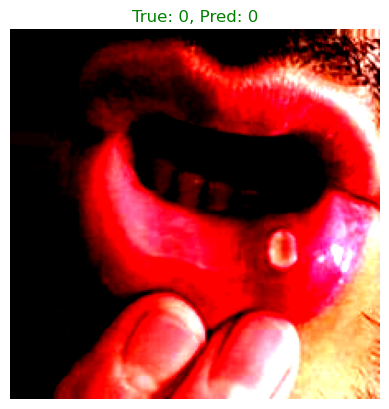

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


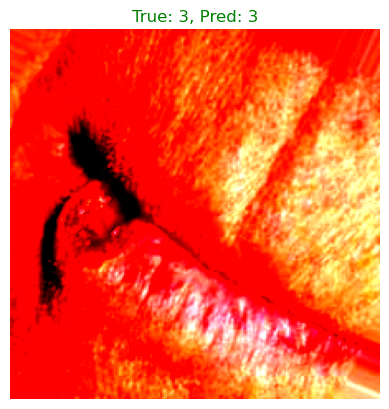

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


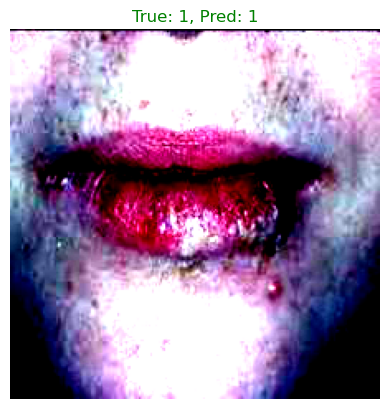

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


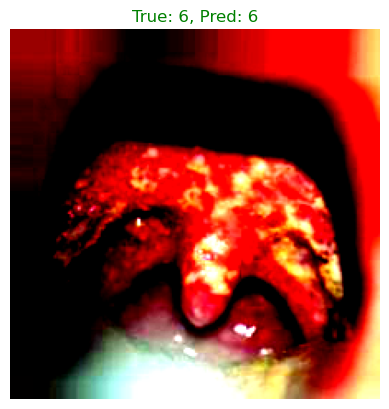

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


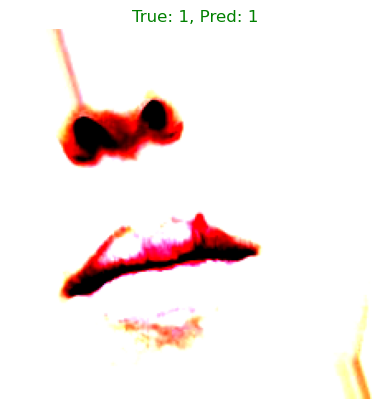

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


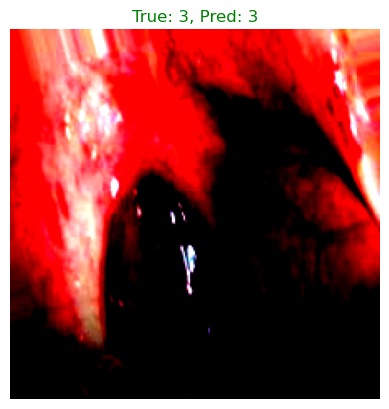

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


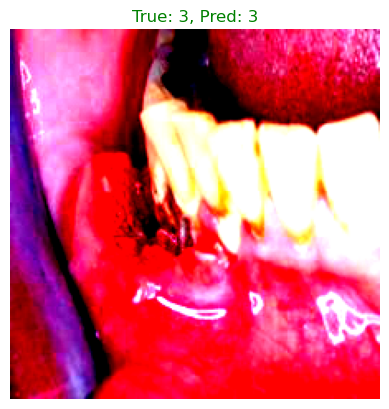

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


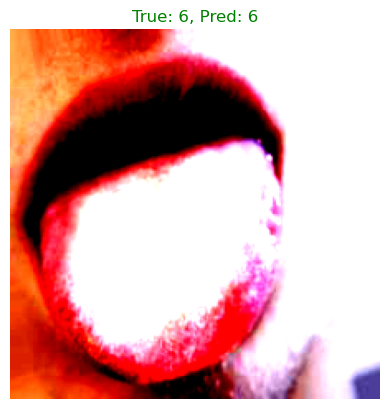

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


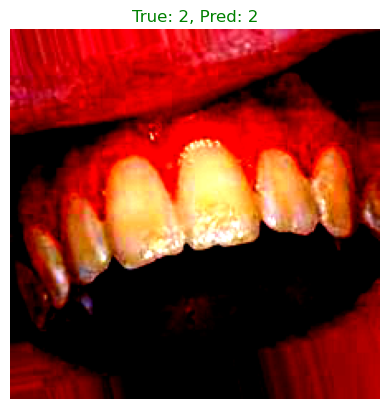

Correct: 48, incorrect: 2


In [10]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
visualize_predictions(model=best_model, test_dataset=test_dataset, device=device, num_samples=50)

### Resnet50

In [26]:
resnet50_best_model = torch.load("./models_weights/resnet50/best_model.pth")

C:\Users\001\AppData\Local\Temp\ipykernel_57784\2289633303.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet50_best_model = torch.load("./models_weights/resnet50/be

100%|██████████| 65/65 [00:07<00:00,  8.17it/s]


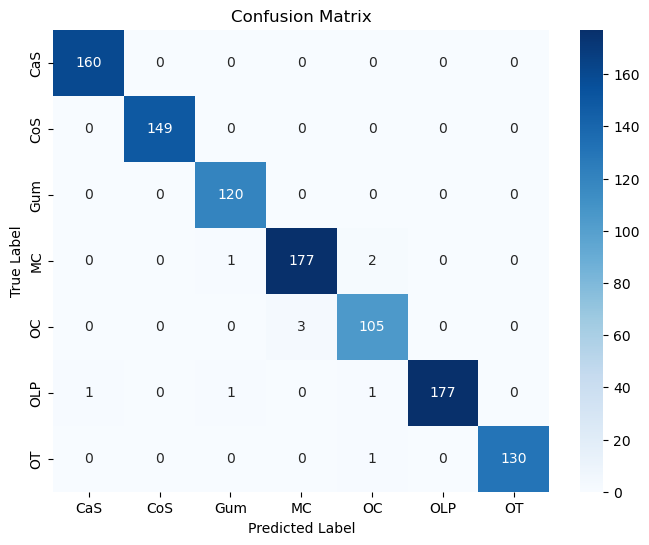

Average Loss: 0.0399
Accuracy: 99.0272
Precision: 0.9903
Recall: 0.9903
F1 Score: 0.9903


In [27]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion_eval = nn.CrossEntropyLoss()
best_avg_loss, best_test_acc, best_test_prec, best_test_recall, best_test_f1 = evaluate(dataloader=test_loader, model=resnet50_best_model, device=device, criterion=criterion_eval, is_testing=True, class_names=test_dataset.classes)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


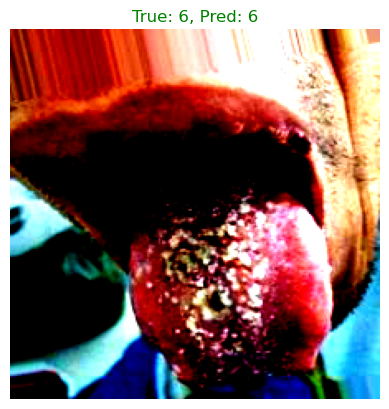

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


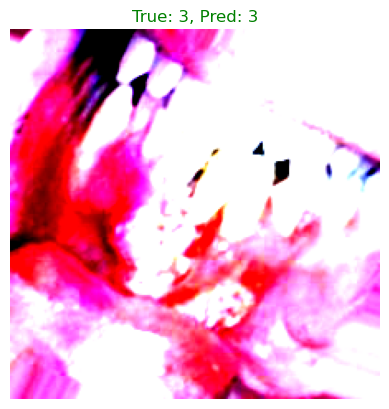

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


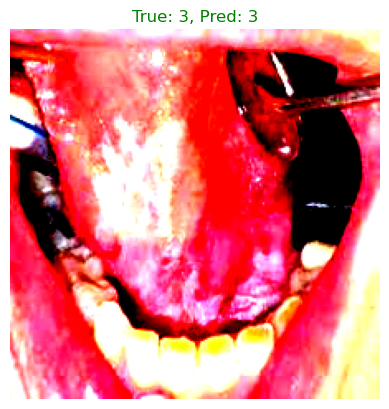

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


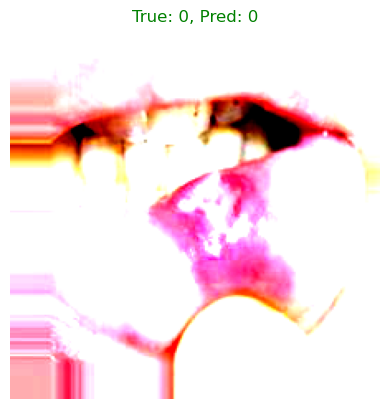

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


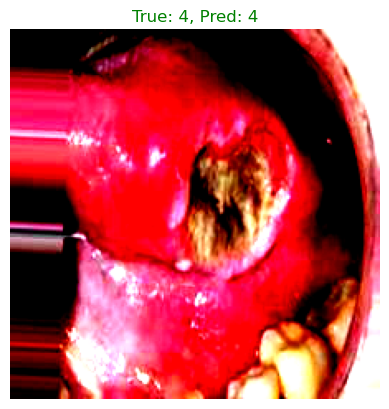

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


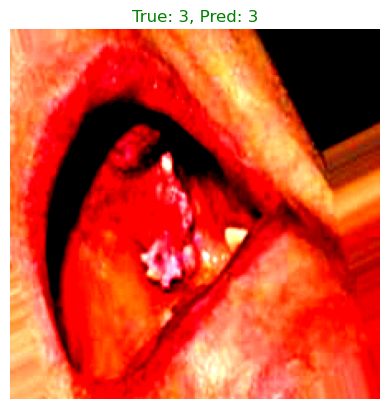

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


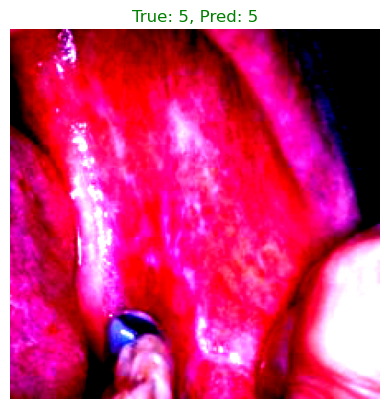

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


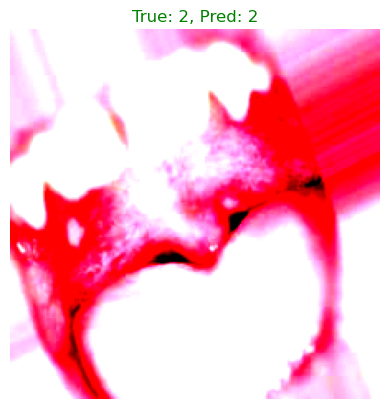

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


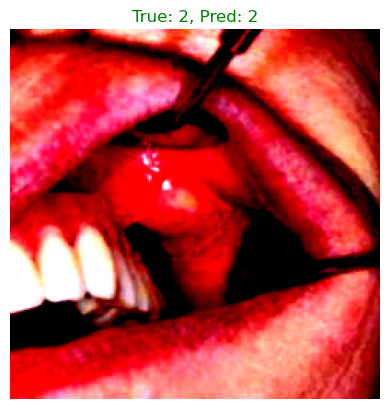

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


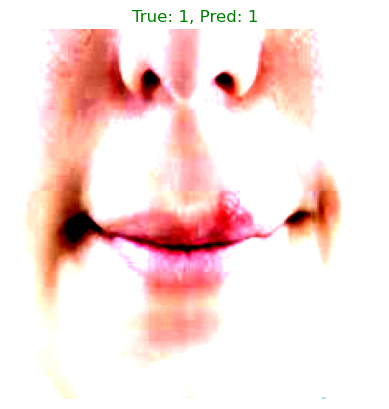

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


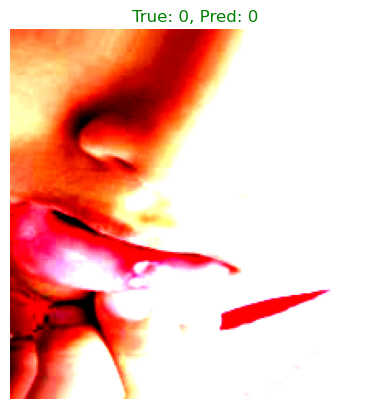

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


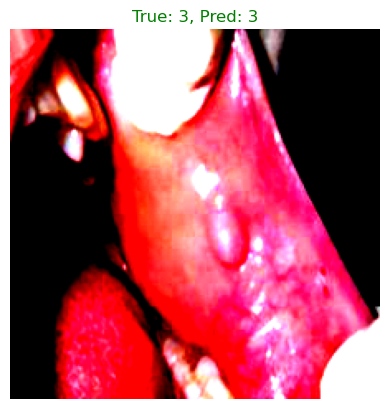

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


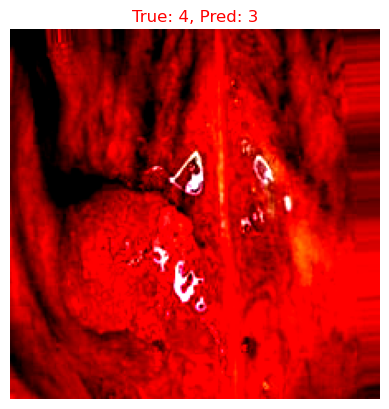

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


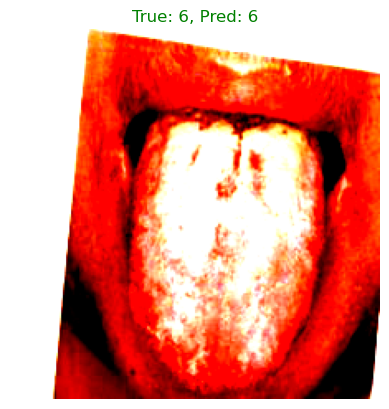

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


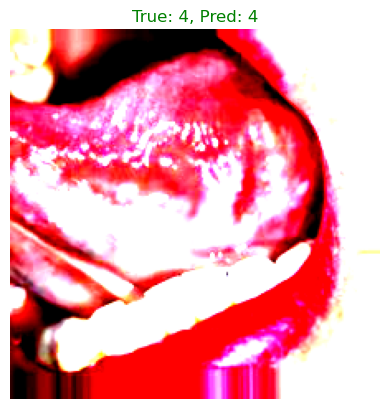

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


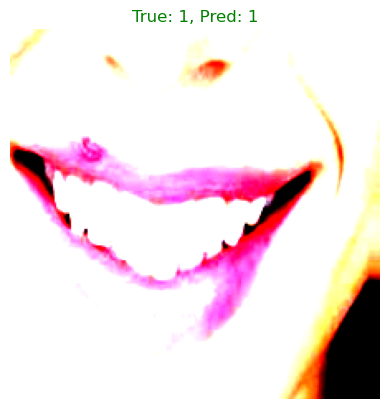

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


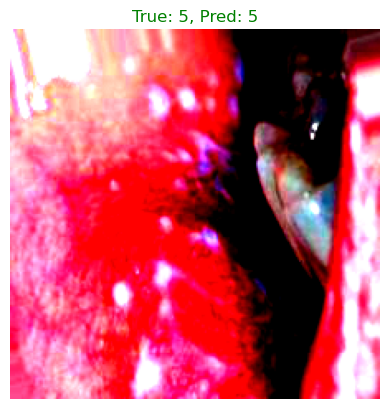

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


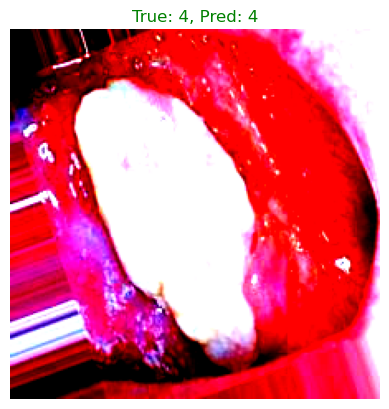

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


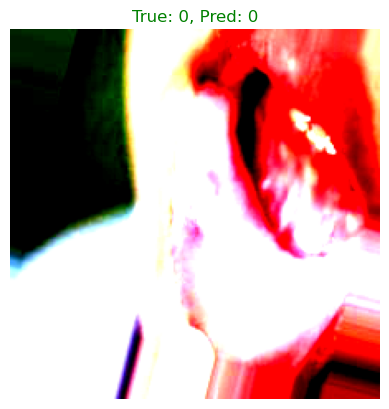

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


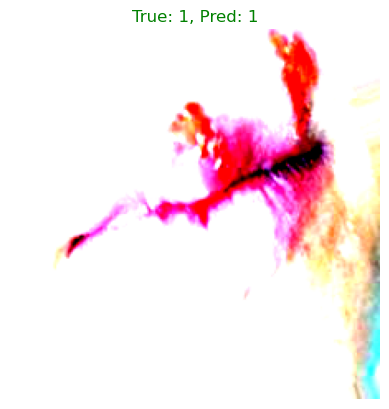

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


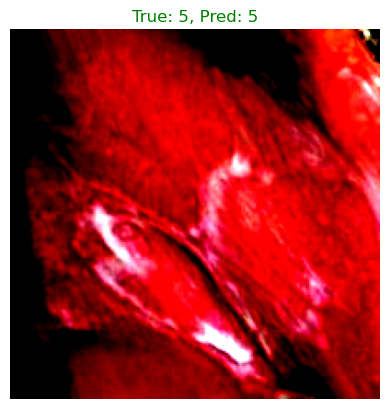

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


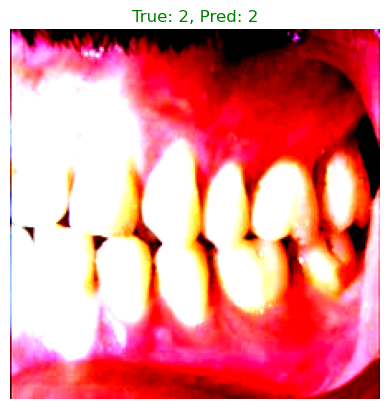

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


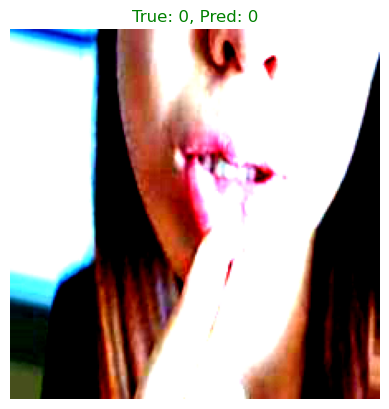

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


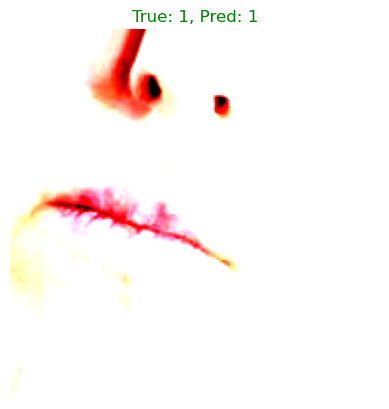

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


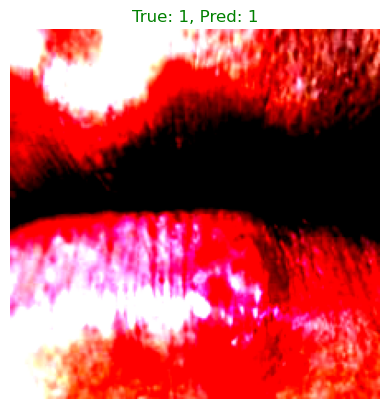

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


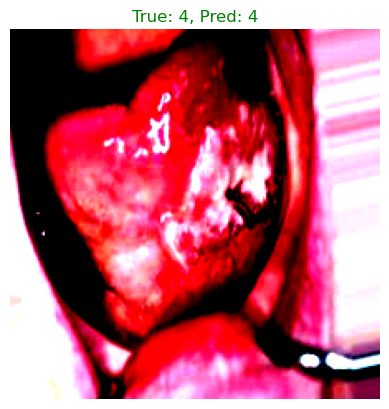

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


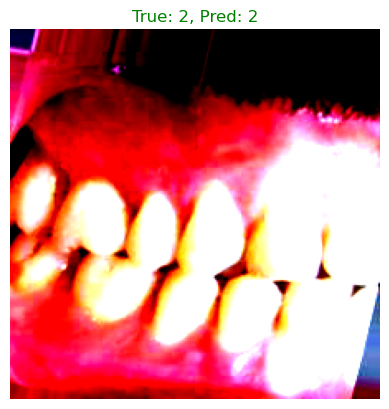

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


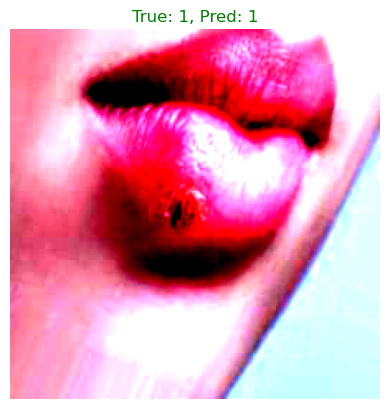

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


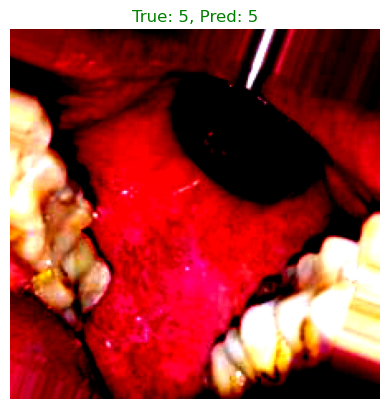

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


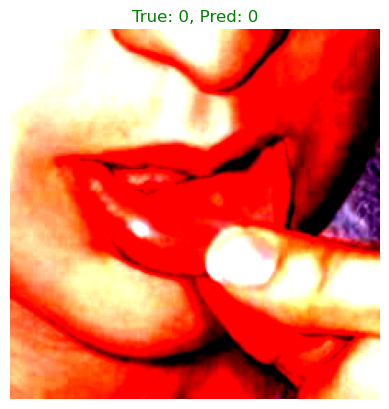

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


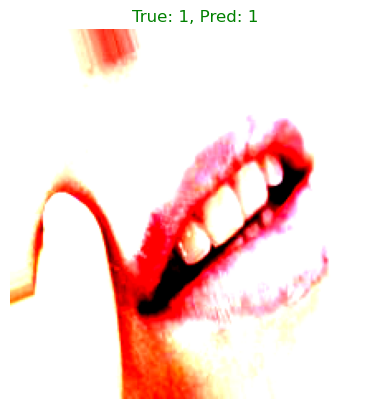

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


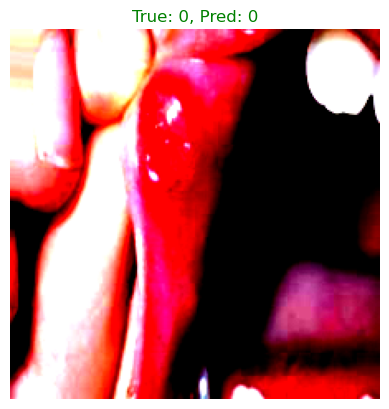

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


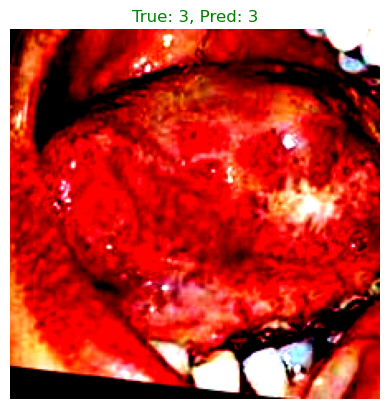

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


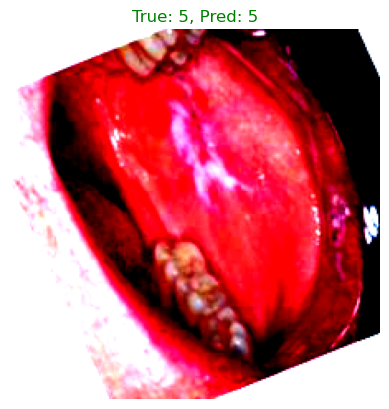

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


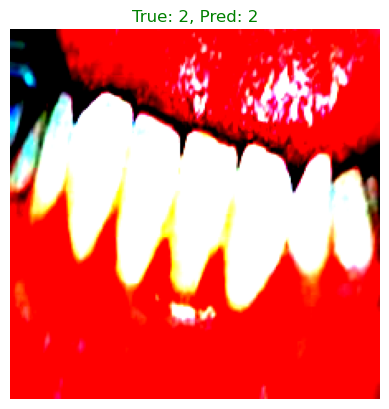

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


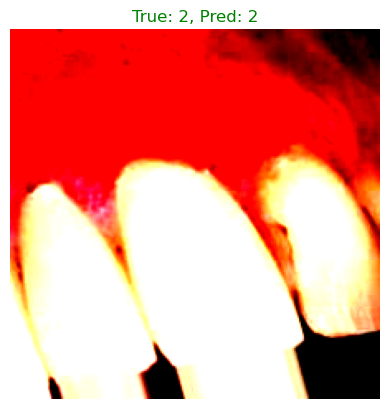

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


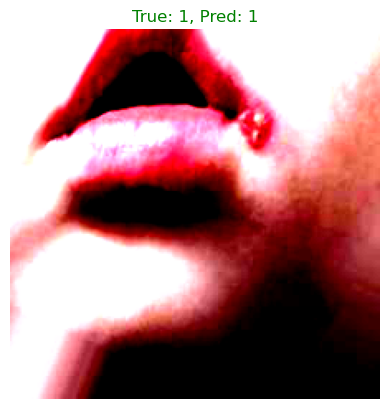

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


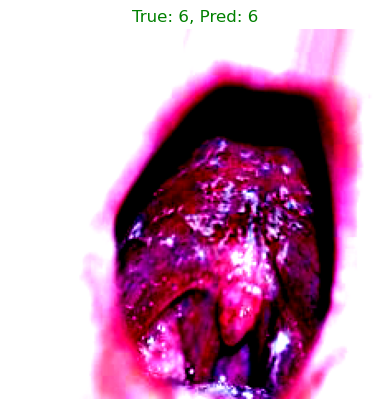

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


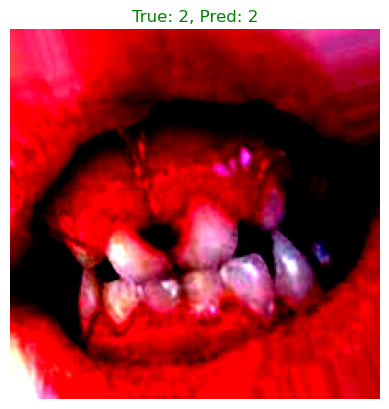

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


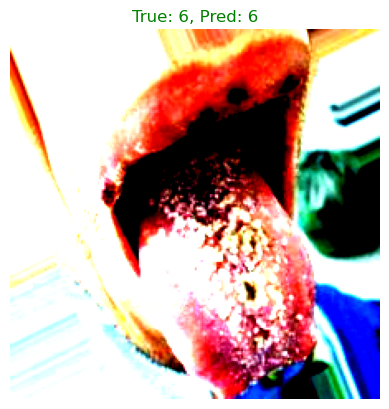

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


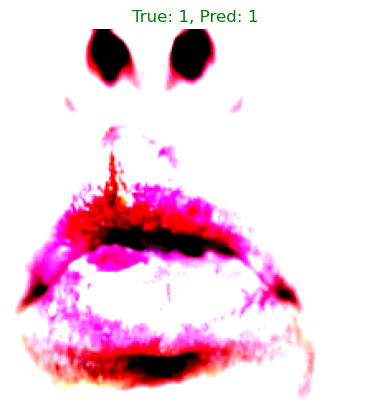

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


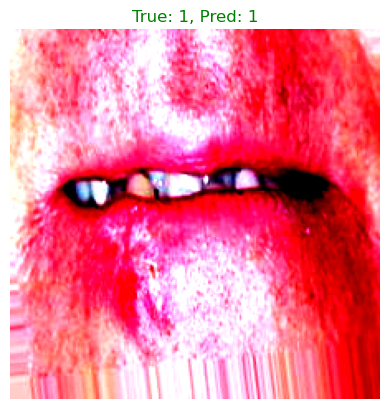

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


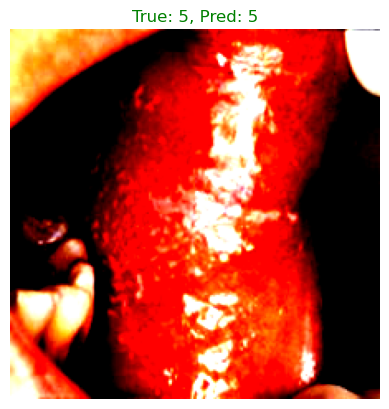

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


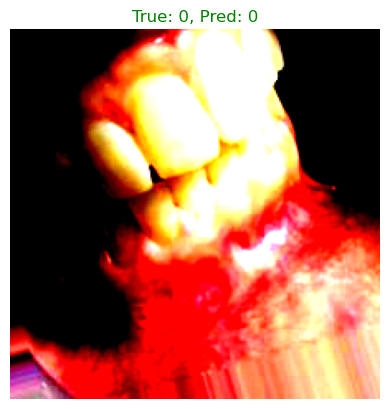

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


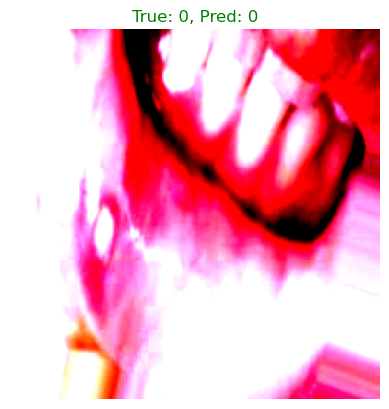

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


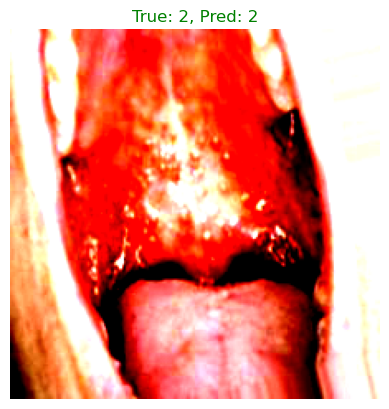

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


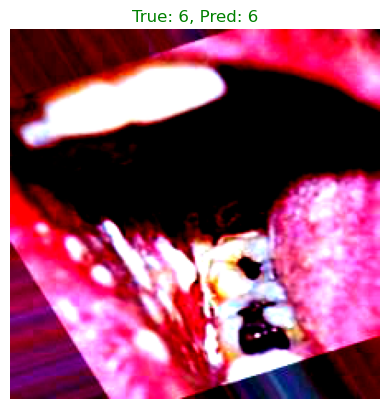

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


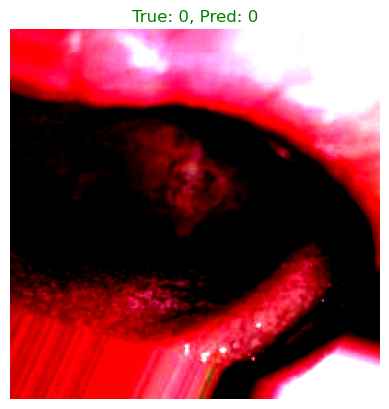

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


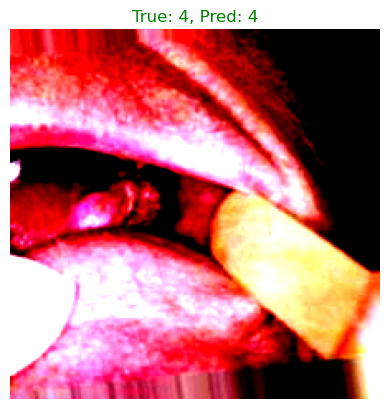

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


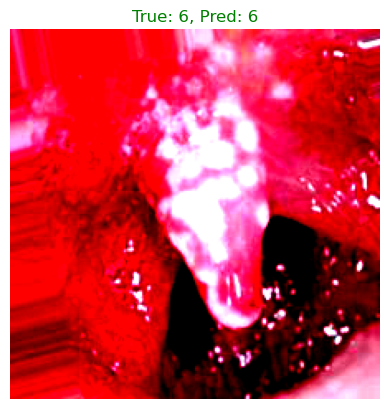

Correct: 49, incorrect: 1


In [34]:
visualize_predictions(model=resnet50_best_model, test_dataset=test_dataset, device=device, num_samples=50)

C:\Users\001\AppData\Local\Temp\ipykernel_57784\2656413731.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  resnet50_final_model = torch.load("./models_weights/resnet50/f

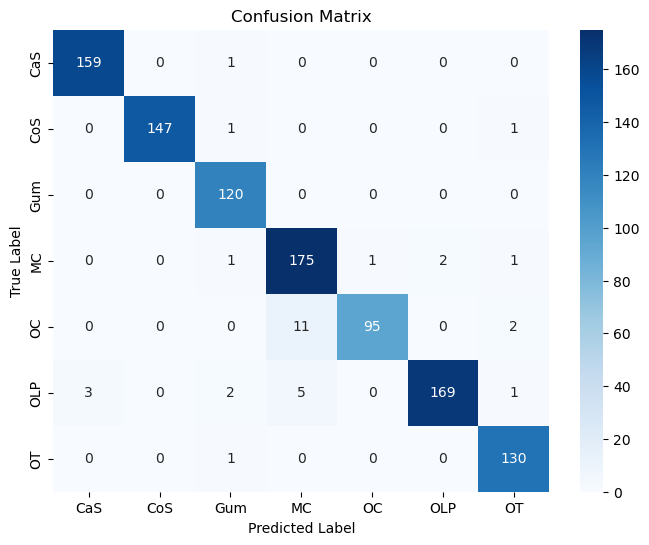

Average Loss: 0.1077
Accuracy: 96.7899
Precision: 0.9690
Recall: 0.9679
F1 Score: 0.9678


In [30]:
resnet50_final_model = torch.load("./models_weights/resnet50/final_model.pth")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
criterion_eval = nn.CrossEntropyLoss()
final_avg_loss, final_test_acc, final_test_prec, final_test_recall, final_test_f1 = evaluate(dataloader=test_loader, model=resnet50_final_model, device=device, criterion=criterion_eval, is_testing=True, class_names=test_dataset.classes)

# Streamlit

To view the simple streamlit app, click here: https://teeth-classification-2.streamlit.app/